In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from selenium.webdriver.remote.webelement import WebElement
from lavague.evaluator import keep_assignments
import ast

class VariableVisitor(ast.NodeVisitor):
    def __init__(self):
        super().__init__()
        self.output = []
    
    def visit_Assign(self, node):
        
        # For each assignment, print the targets (variables)
        for target in node.targets:
            if isinstance(target, ast.Name):  # Ensure it's a variable assignment
                self.output.append(target.id)

def return_assigned_variables(code_snippet):
    # Parse the code snippet into an abstract syntax tree (AST)
    parsed = ast.parse(code_snippet)
    
    # Create a VariableVisitor object
    visitor = VariableVisitor()
    
    # Visit (i.e., traverse) the AST nodes
    visitor.visit(parsed)
    
    return visitor.output

def get_highlighted_element(generated_code, driver):

    assignment_code = keep_assignments(generated_code)

    code = f"""
from selenium.webdriver.common.by import By
from selenium.webdriver.common.action_chains import ActionChains
{assignment_code}
    """.strip()

    local_scope = {"driver": driver}

    exec(code, globals(), local_scope)

    variable_names = return_assigned_variables(generated_code)

    elements = []

    for variable_name in variable_names:
        var = local_scope[variable_name]
        if type(var) == WebElement:
            elements.append(var)
            
    first_element = elements[0]
    driver.execute_script("arguments[0].setAttribute('style', arguments[1]);", first_element, "border: 2px solid red;")
    driver.execute_script("arguments[0].scrollIntoView();", first_element)
    driver.save_screenshot("screenshot.png")
    image = Image("screenshot.png")
    driver.execute_script("arguments[0].setAttribute('style', '');", first_element)
    return image

In [3]:
from abc import ABC, abstractmethod
from typing import Any
import requests

HF_PROMPT_TEMPLATE = """
You are an AI system whose goal is to generate training examples to teach other AIs to think and reach objectives given by humans and a screenshot of the current page.
The AIs to be taught have to write their thought process and propose an instruction to be performed.
Your answer should contain your thoughts in bullet points, and the instruction for the next step to be performed.
The instruction should be detailled as possible and only contain one step. Do not provide bullet points or multiple steps.
Leverage as much information from the screenshot to make it easy to identify the element, such as placeholders or text.
Do not make assumptions about elements you do not see.
If the objective is already achieved in the screenshot, provide the instruction 'STOP'.

Here are previous examples:
Objective: Ask the AI model 'Command R plus' 'What is love'
Thought: 
- I am on the Hugging Face website. 
- Hugging Face is a company that hosts AI models, and allows users to interact with models on them through the chat.
- Therefore, to answer the objective of asking the AI model 'Command R Plus' 'What is love', we need first to find the model page.
- Given the current screenshot, the fastest way to find the model page seems to be to use the search bar.
Instruction: Type 'Command R plus' on the search bar with placeholder "Search ..." and click on the first result

Objective: Explore the latest updates on the model 'Meta-Llama-3-8B'
Thought:
- I am currently viewing the main page of Hugging Face, a hub for AI models and datasets.
- On this platform, users can explore and interact with a variety of AI models.
- From the current screenshot, I see that the model 'Meta-Llama-3-8B' is displayed in the "Trending" section.
- To investigate the updates made to 'Meta-Llama-3-8B', the best approach is to go directly to the model's specific page where information will be available
Instruction: Click on 'Meta-Llama-3-8B'

Objective: Print installation steps for Hugging Face's Diffusers library
Thought:
- The current page seems to be the home page of the Diffusers' library.
- The installation section is highlighted on the menu on the left-side menu.
- The current page does not provide sufficient information about how to install Diffusers.
- To get more information on installation steps, clicking on the 'Installation' link on the left menu is the best choice.
Instruction: Click on 'Installation', next to 'Effective and efficient diffusion'

Objective: Get information on KANs-base models
Thought:
- The current page is a social post on Hugging Face's website.
- The post is about the recent work of KANs models with GPT2.
- Since this provides sufficient information on KANs, no further action is required to achieve the objective. 
Instruction: STOP

Objective: {objective}
Thought:
"""

class BaseWorldModel(ABC):
    """Abstract class for WorldModel"""

    @abstractmethod
    def get_instruction(self, state: Any, objective: str) -> str:
        """
        Generate the instruction for the agent to reach the objective
        
        Args:
            state: Current state of the world
            objective: Goal to reach
            
        Returns:
            str: Instruction for the agent
        """
        pass

import re

def extract_instruction(text):
    # Use a regular expression to find the content after "Instruction:"
    match = re.search(r"Instruction:\s*(.*)", text)
    if match:
        return match.group(1).strip()  # Return the matched group, stripping any excess whitespace
    else:
        raise ValueError("No instruction found in the text.")


import os
from openai import OpenAI

class GPTWorldModel(BaseWorldModel):
    """Class for Vision-based WorldModel"""
    
    def __init__(self, api_key: str = None, prompt_template: str = HF_PROMPT_TEMPLATE):
        self.prompt_template = prompt_template
        if not api_key:
            api_key = os.getenv("OPENAI_API_KEY")
        if api_key is None:
            raise ValueError("No api_key is provided or OPENAI_API_KEY environment variable is not set")
        self.api_key = api_key
        self.client = OpenAI(api_key=api_key)
    
    def get_instruction(self, state: str, objective: str) -> str:
        base64_image = state
        
        prompt = self.prompt_template.format(objective=objective)

        model = "gpt-4-turbo"
        messages = [
            {
            "role": "user",
            "content": [
                {
                "type": "text",
                "text": prompt
                },
                {
                "type": "image_url",
                "image_url": {
                    "url": f"data:image/jpeg;base64,{base64_image}",
                    "detail": "high"
                }
                }
            ]
            }
        ]
        response  = self.client.chat.completions.create(
            model=model,
            messages=messages,
            max_tokens=300, temperature=0.0, seed=42
        )

        output = response.choices[0].message.content
        return output

class AzureWorldModel(BaseWorldModel):
    """Class for Vision-based WorldModel"""
    
    def __init__(self, api_key: str, endpoint: str, prompt_template: str = HF_PROMPT_TEMPLATE):
        self.prompt_template = prompt_template
        self.api_key = api_key
        self.endpoint = endpoint
    
    def get_instruction(self, state: str, objective: str) -> str:
        base64_image = state
        headers = {
            "Content-Type": "application/json",
            "api-key": self.api_key,
        }
        
        prompt = self.prompt_template.format(objective=objective)

        # Payload for the request
        payload = {
        "messages": [
            {
            "role": "user",
            "content": [
                {
                "type": "text",
                "text": prompt
                },
                {
                "type": "image_url",
                "image_url": {
                    "url": f"data:image/jpeg;base64,{base64_image}"
                }
                }
            ]
            }
        ],
        "temperature": 0.0,
        "top_p": 0.95,
        "max_tokens": 800
        }
        
        endpoint = self.endpoint

        # Send request
        try:
            response = requests.post(endpoint, headers=headers, json=payload)
            response.raise_for_status()  # Will raise an HTTPError if the HTTP request returned an unsuccessful status code
        except requests.RequestException as e:
            raise SystemExit(f"Failed to make the request. Error: {e}")

        output = response.json()["choices"][0]["message"]["content"]
        return output

In [4]:

world_model = GPTWorldModel()

# import os

# api_key = os.environ["AZURE_OPENAI_VISION_KEY"]
# endpoint = os.environ["AZURE_OPENAI_VISION_ENDPOINT"]

# world_model = AzureWorldModel(api_key, endpoint)

In [5]:
import base64

# Function to encode the image
def encode_image(image_path):
  with open(image_path, "rb") as image_file:
    return base64.b64encode(image_file.read()).decode('utf-8')

In [6]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.keys import Keys
import os.path

chrome_options = Options()
chrome_options.add_argument("--headless")  # Ensure GUI is off
chrome_options.add_argument("--no-sandbox")
chrome_options.add_argument("--window-size=1024,768")

homedir = os.path.expanduser("~")

# Paths to the chromedriver files
path_linux = f"{homedir}/chromedriver-linux64/chromedriver"
path_testing = f"{homedir}/chromedriver-testing/chromedriver"
path_mac = (
    "Google Chrome for Testing.app/Contents/MacOS/Google Chrome for Testing"
)

# To avoid breaking change kept legacy linux64 path
if os.path.exists(path_linux):
    chrome_options.binary_location = f"{homedir}/chrome-linux64/chrome"
    webdriver_service = Service(f"{homedir}/chromedriver-linux64/chromedriver")
elif os.path.exists(path_testing):
    if os.path.exists(f"{homedir}/chrome-testing/{path_mac}"):
        chrome_options.binary_location = f"{homedir}/chrome-testing/{path_mac}"
    # Can add support here for other chrome binaries with else if statements
    webdriver_service = Service(f"{homedir}/chromedriver-testing/chromedriver")
else:
    raise FileNotFoundError("Neither chromedriver file exists.")

driver = webdriver.Chrome(service=webdriver_service, options=chrome_options)



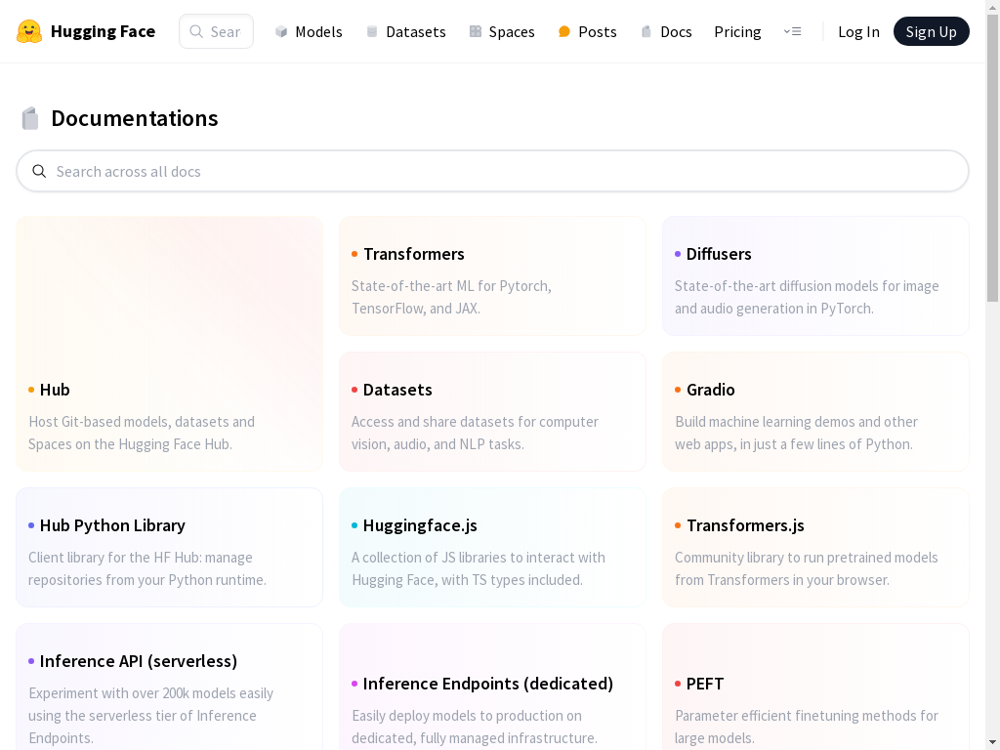

In [7]:

driver.get("https://huggingface.co/docs")
driver.save_screenshot("screenshot.png")

from IPython.display import Image, display
display(Image("screenshot.png"))

In [8]:
import os
from llama_index.llms.azure_openai import AzureOpenAI
from lavague.retrievers import BM25HtmlRetriever, OpsmSplitRetriever
from lavague.defaults import DefaultEmbedder, DefaultLLM

# api_key=os.getenv("AZURE_OPENAI_KEY")
# api_version="2024-02-15-preview"
# azure_endpoint = os.getenv("AZURE_OPENAI_ENDPOINT")
# model = "gpt-35-turbo"
# deployment_name = "gpt-35-turbo"

# from llama_index.llms.azure_openai import AzureOpenAI
# import os

# api_key=os.getenv("AZURE_OPENAI_KEY")
# api_version="2023-05-15"
# azure_endpoint = os.getenv("AZURE_OPENAI_ENDPOINT")
# model = "gpt-4"
# deployment_name = "gpt-4-turbo"

# llm = AzureOpenAI(
#     model=model,
#     deployment_name=deployment_name,
#     api_key=api_key,
#     azure_endpoint=azure_endpoint,
#     api_version=api_version,
#     temperature=0.0
# )


model = "gpt-3.5-turbo-0125"

llm = DefaultLLM(model=model)

# from llama_index.embeddings.huggingface import HuggingFaceEmbedding

# LOCAL_EMBED_MODEL = "BAAI/bge-small-en-v1.5"

# class Embedder(HuggingFaceEmbedding):
#     def __init__(self, model_name: str = LOCAL_EMBED_MODEL, device: str = "cuda"):
#         super().__init__(model_name, device)

# embedder = Embedder()
embedder = DefaultEmbedder()


from lavague.action_engine import ActionEngine

# bm25_retriever = BM25HtmlRetriever(embedder)

opsm_retriever = OpsmSplitRetriever(embedder, top_k=3)
action_engine = ActionEngine(llm, opsm_retriever)


In [9]:
def display_screenshot(driver):
    driver.save_screenshot("screenshot.png")
    display(Image("screenshot.png"))
    

  0%|          | 0/5 [00:00<?, ?it/s]

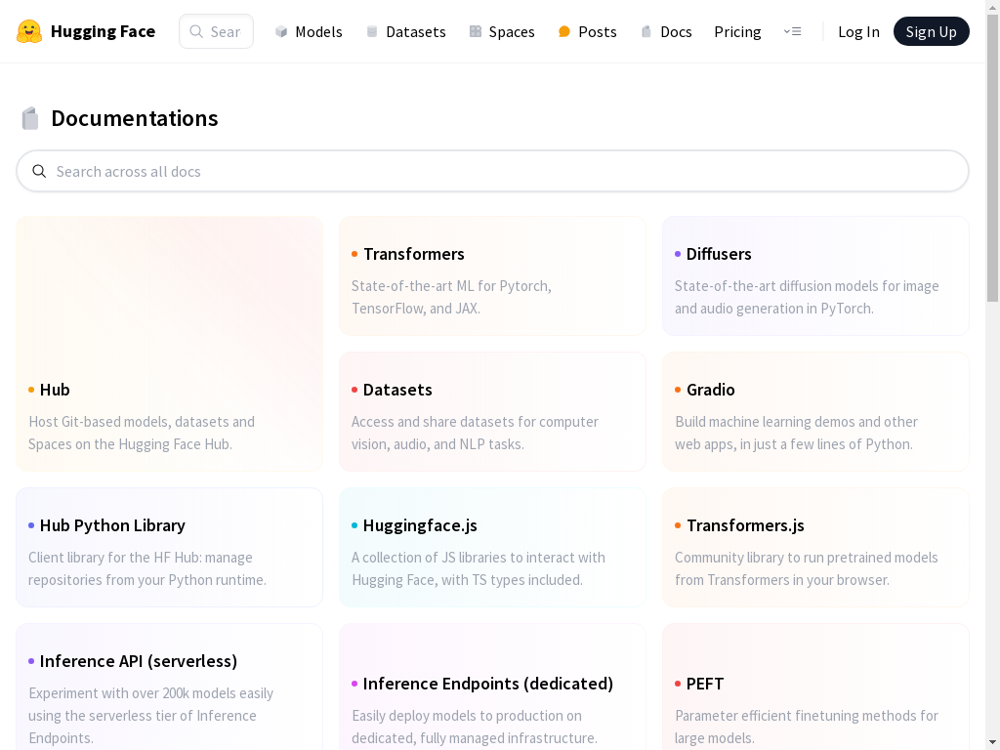

Thoughts: Thought:
- The current page is the Documentation section of the Hugging Face website.
- This section provides access to various resources including libraries and tools related to machine learning.
- The objective is to go on the quick tour of PEFT (Parameter Efficient Fine-Tuning methods for large models).
- From the screenshot, I can see that PEFT is listed under the section titled "Documentation" on the right side of the page.
- To access the quick tour of PEFT, the next logical step is to navigate to the specific page for PEFT.

Instruction: Click on 'PEFT' under the 'Documentation' section on the right side of the page.
Code execution failed. Retrying...


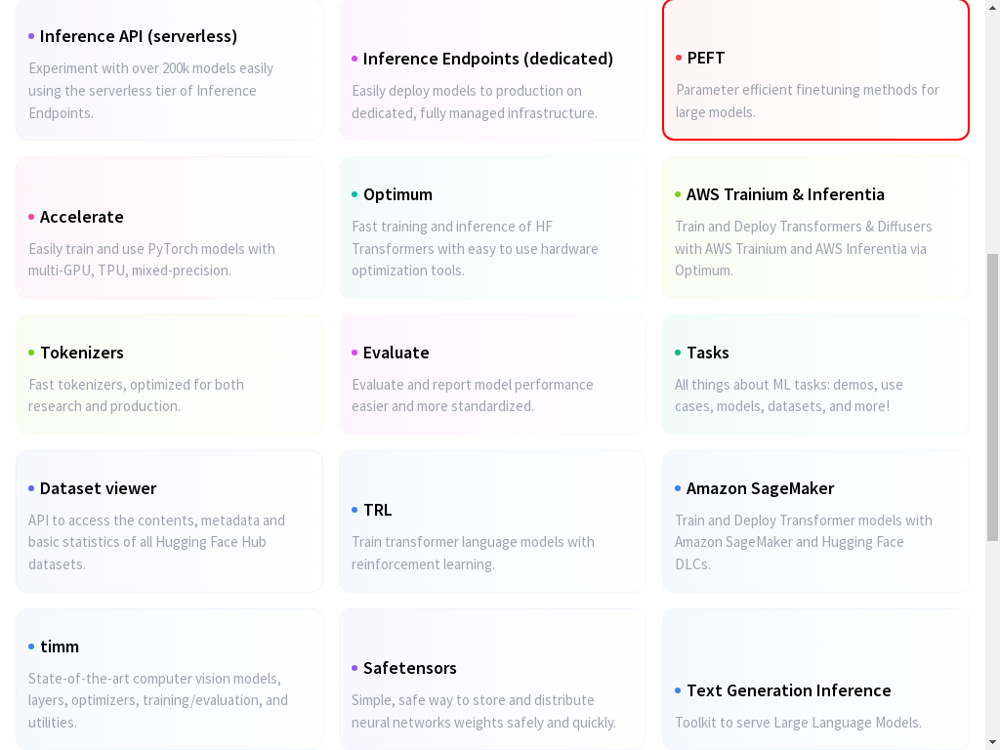

# Let's proceed step by step.
# First we need to identify the link that contains the text 'PEFT' under the 'Documentation' section.

# Based on the HTML provided, we can identify the 'Documentation' section by its text content.
# Then we find the link with the text 'PEFT' within this section.
# We use the following XPath to find the link:
peft_link = driver.find_element(By.XPATH, """//*[contains(text(),'Documentations')]/following::a[contains(.,"PEFT")]""")

# Then we can click on the link
peft_link.click()


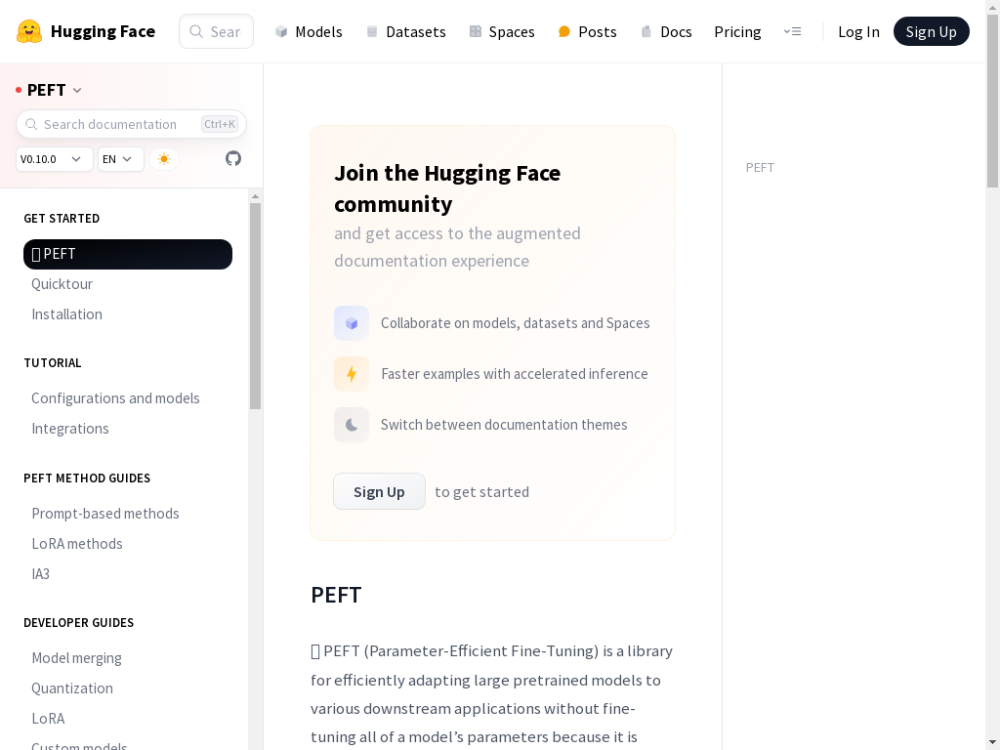

 20%|██        | 1/5 [00:33<02:13, 33.27s/it]

Step ended


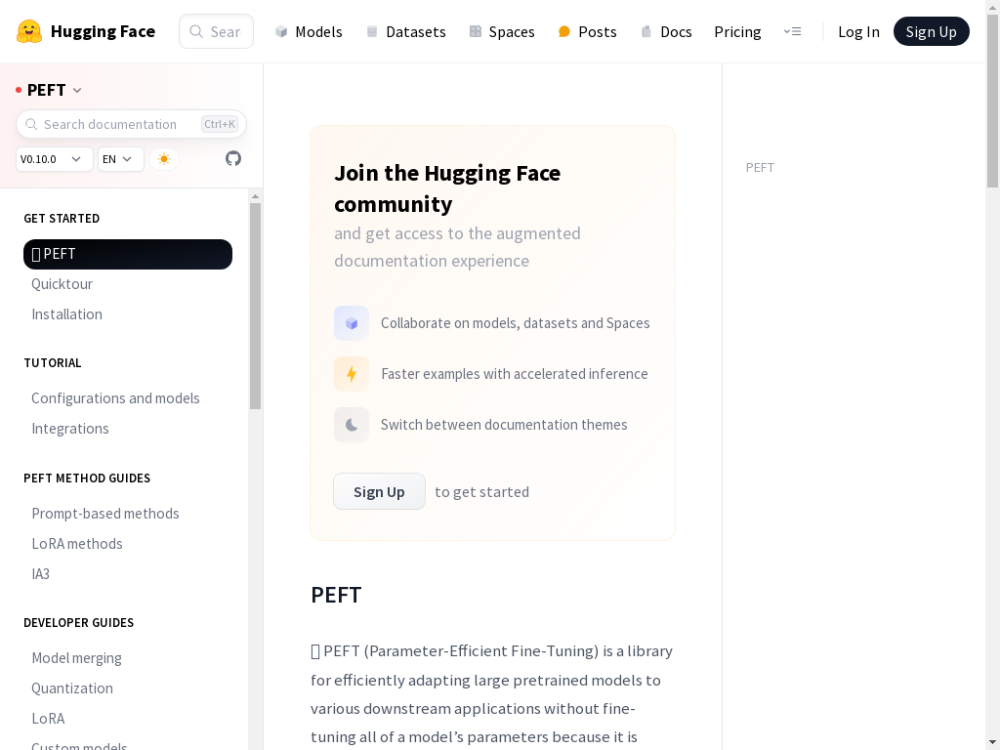

Thoughts: Thought:
- The current screenshot shows the documentation page for PEFT (Parameter-Efficient Fine-Tuning) on the Hugging Face website.
- The left sidebar contains various sections including "GET STARTED", "TUTORIAL", and "PEFT METHOD GUIDES".
- Under the "GET STARTED" section, there is an option labeled "Quicktour", which is likely a brief guide or introduction to PEFT.
- Since the objective is to go on the quicktour of PEFT, the next logical step is to access this section.

Instruction: Click on 'Quicktour' under the 'GET STARTED' section in the left sidebar.


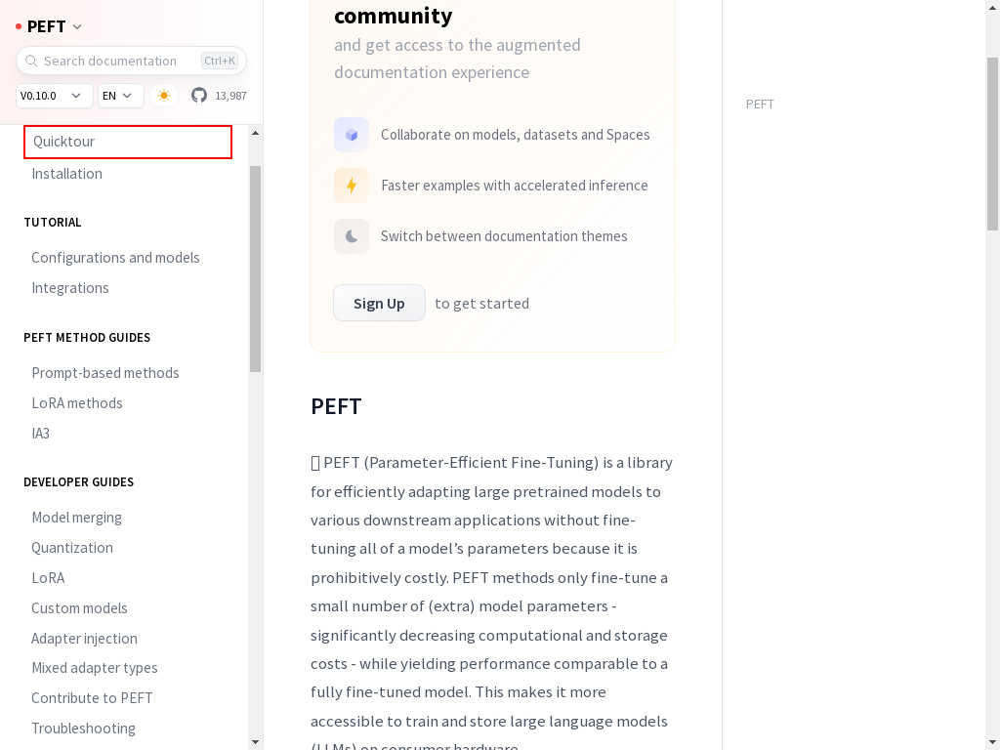

# Let's proceed step by step.
# First we need to identify the 'Quicktour' link under the 'GET STARTED' section in the left sidebar.

# Based on the HTML provided, we can identify the 'Quicktour' link by its id "quicktour".
# We will use this id with Selenium to identify the link.
quicktour_link = driver.find_element(By.XPATH, """//*[contains(@id,"quicktour")][contains(@href,"/docs/peft/quicktour")]""")

# Then we can click on the link.
quicktour_link.click()


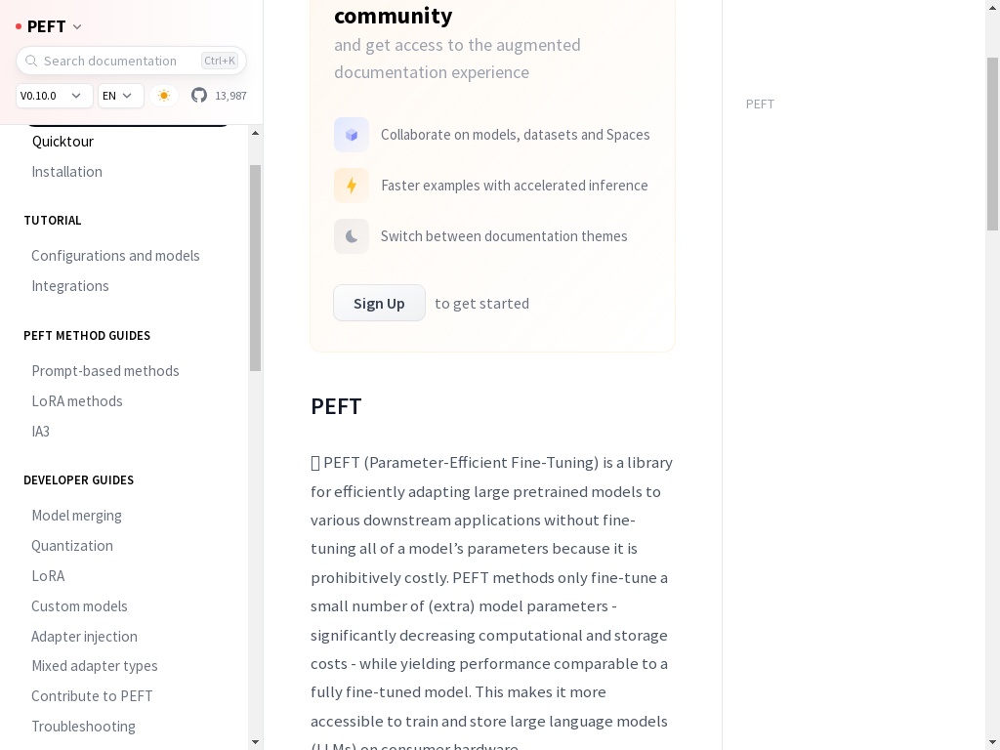

 40%|████      | 2/5 [00:54<01:18, 26.11s/it]

Step ended


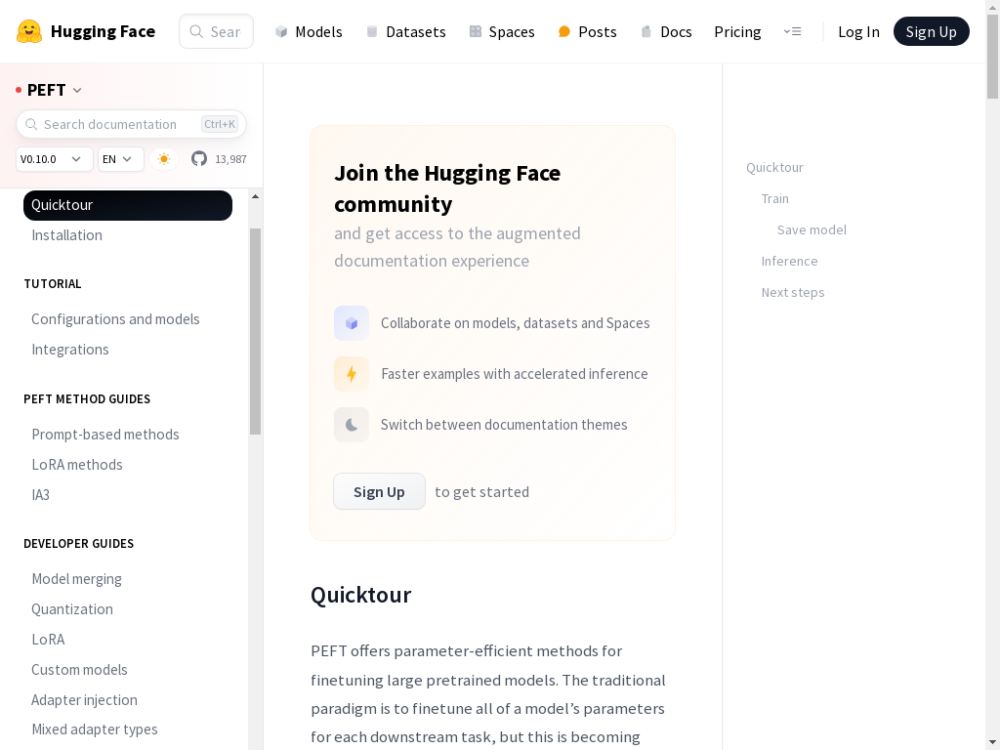

Thoughts: Thought:
- The current screenshot shows the documentation page for PEFT on the Hugging Face website.
- The left sidebar clearly lists various sections of the documentation, including "Quicktour."
- The objective is to go on the quicktour of PEFT, and the "Quicktour" link is visible on the left sidebar.
- Clicking on this link will likely lead directly to the quicktour content.

Instruction: Click on 'Quicktour' in the left sidebar under the PEFT section.


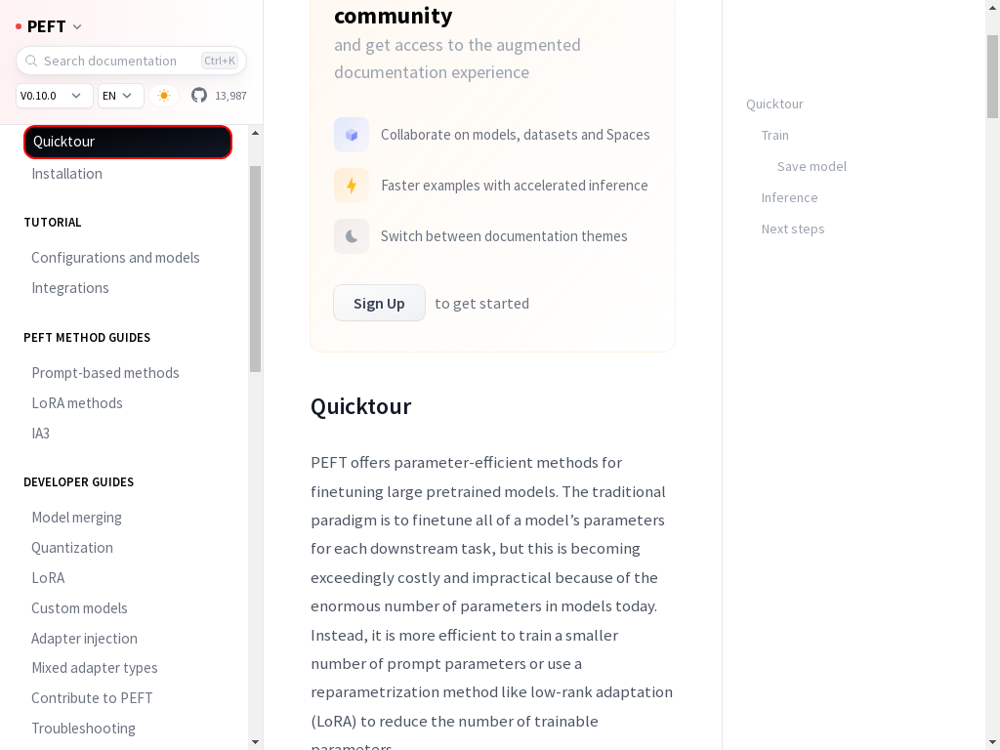

# Let's proceed step by step.
# First we need to identify the 'Quicktour' link in the left sidebar under the PEFT section, then we can click on it.

# Based on the HTML provided, we need to devise the best strategy to select the link.
# The 'Quicktour' link can be identified using its href attribute and the text content.
quicktour_link = driver.find_element(By.XPATH, """//*[contains(@href,"/docs/peft/quicktour")][contains(text(),"Quicktour")]""")

# Then we can click on it
quicktour_link.click()


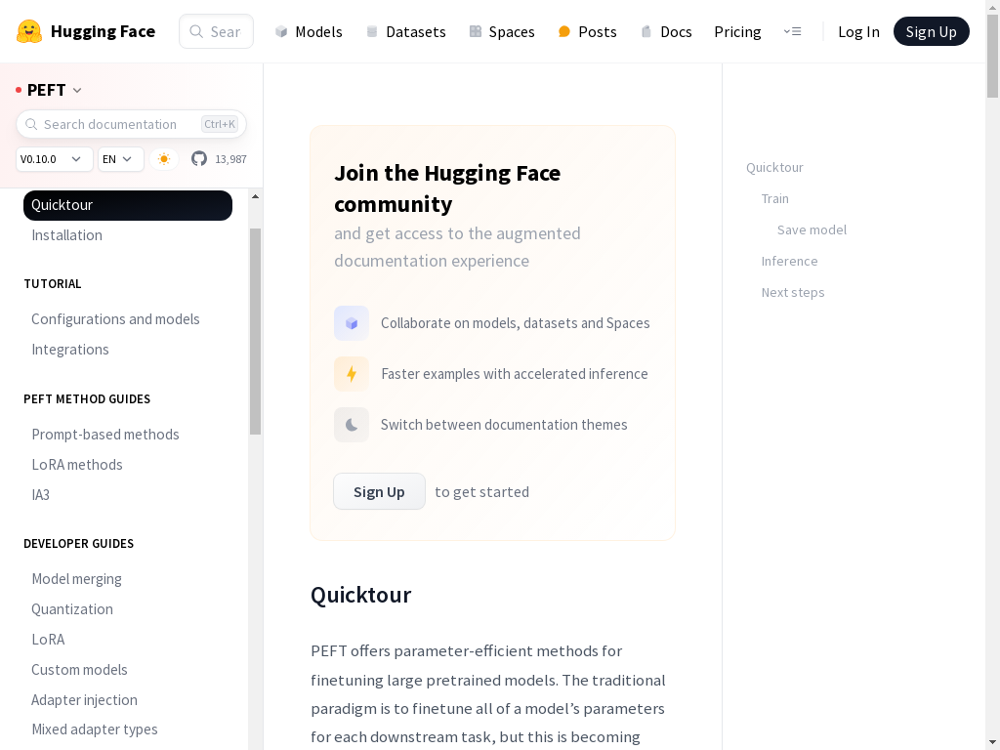

 60%|██████    | 3/5 [01:10<00:43, 21.70s/it]

Step ended


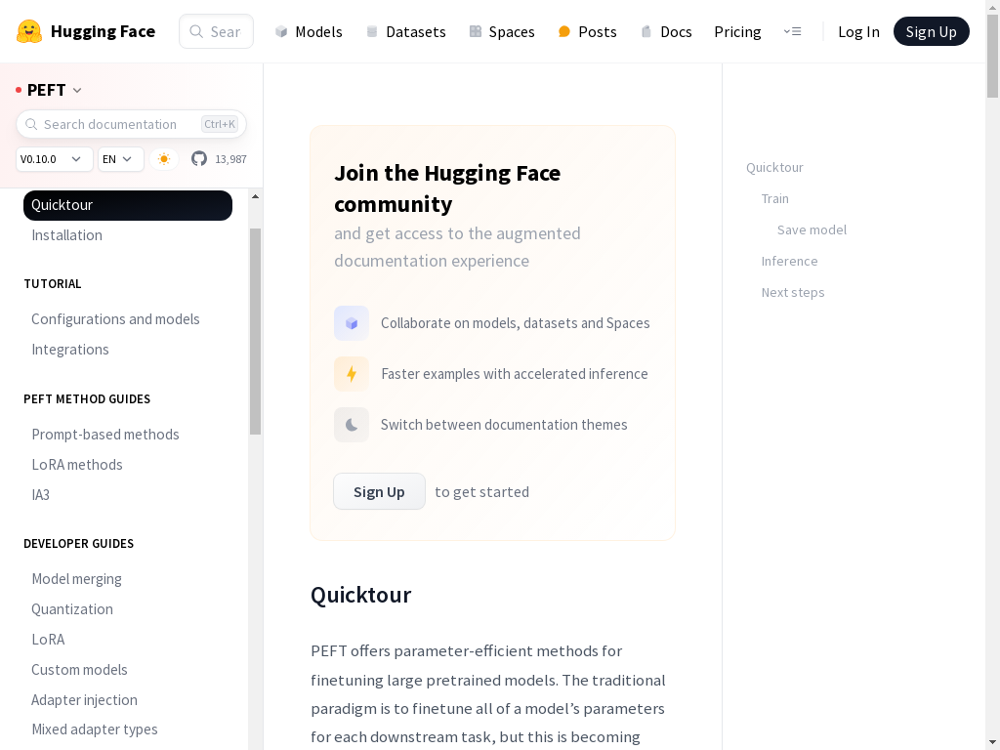

 60%|██████    | 3/5 [01:18<00:52, 26.02s/it]

Thoughts: Thought:
- The current screenshot shows the documentation page for PEFT on the Hugging Face website.
- The left sidebar of the page lists various sections of the PEFT documentation, including "Quicktour."
- The "Quicktour" option is visible and highlighted in the sidebar, indicating it is currently selected.
- The main content area of the page should display the information related to the "Quicktour" of PEFT, as suggested by the sidebar selection.

Instruction: STOP
Finished


In [14]:
from tqdm import tqdm

model = "gpt-4-1106-preview"

llm = DefaultLLM(model=model)

opsm_retriever = OpsmSplitRetriever(embedder, top_k=3)
action_engine = ActionEngine(llm, opsm_retriever)

objective = "Go on the quicktour of PEFT"
driver.get("https://huggingface.co/docs")
N_retry = 3
N_steps = 5

for i in tqdm(range(N_steps)):
    display_screenshot(driver)
    
    state = encode_image("screenshot.png")
    output = world_model.get_instruction(state, objective)
    
    instruction = extract_instruction(output)
    print("Thoughts:", output)
    if instruction != "STOP":
        query = instruction
        html = driver.page_source

        nodes = action_engine.get_nodes(query, html)
        context = "\n".join(nodes)
        for _ in range(N_retry):
            try:
                action = action_engine.action_from_context(context, query)
                screenshot_before_action = get_highlighted_element(action, driver)
                display(screenshot_before_action)
                
                exec(action)
                print(action)
                display_screenshot(driver)
                break
                
            except Exception as e:
                print("Code execution failed. Retrying...")
                pass
        print("Step ended")
    else:
        print("Finished")
        break

  0%|          | 0/5 [00:00<?, ?it/s]

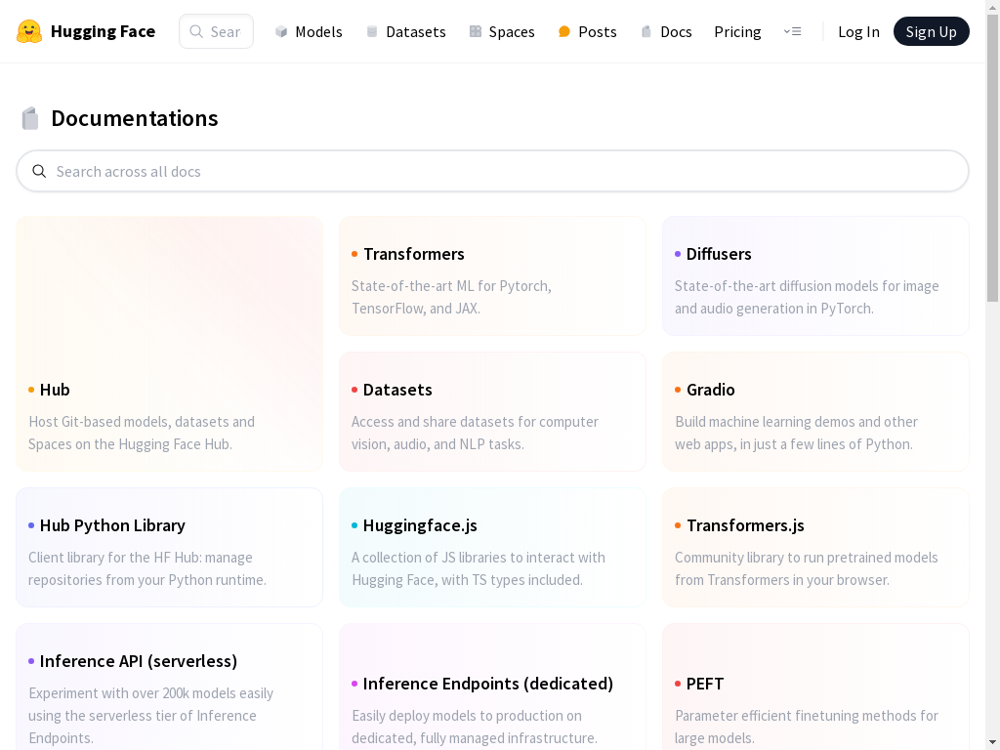

Thoughts: Thought:
- The current page is the Documentation section of the Hugging Face website, which provides information on various tools and libraries.
- The page layout includes multiple sections such as "Transformers", "Datasets", "Diffusers", and more.
- The objective is to go on the quick tour of PEFT (Parameter Efficient Fine-Tuning methods for large models).
- The PEFT section is visible at the bottom right of the screenshot, indicating that it is part of the available documentation on this page.

Instruction: Click on 'PEFT' in the bottom right section of the page.


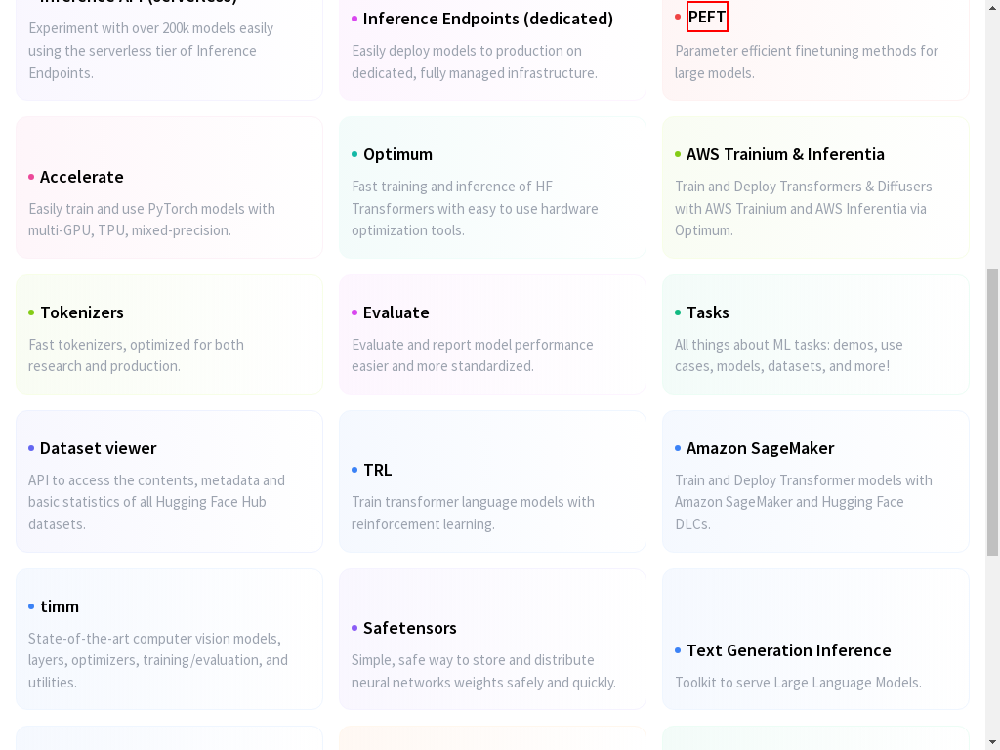

# Let's proceed step by step.
# First we need to identify the link that contains the text 'PEFT' in the bottom right section of the page.

# Based on the HTML provided, we can identify the link by its text content and its position in the DOM.
# Since we are looking for the bottom right section, we can assume it's the last link with the text 'PEFT'.
# We will use the following XPath to find the link:
peft_link = driver.find_element(By.XPATH, "(//*[contains(text(),'PEFT')])[last()]")

# Then we can click on it
peft_link.click()


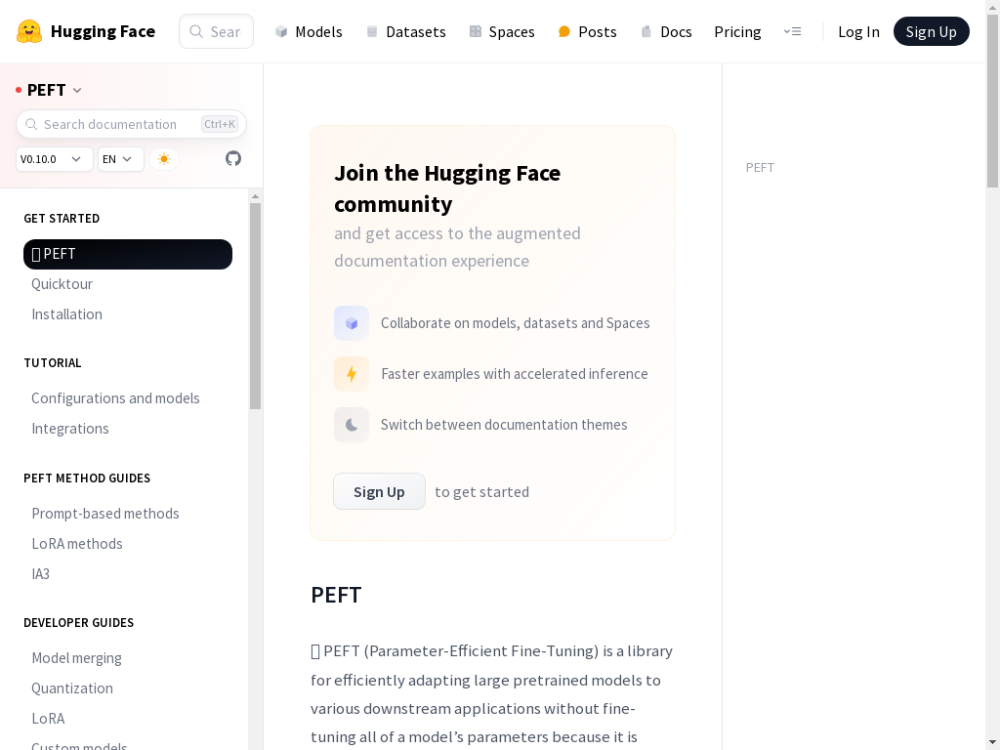

 20%|██        | 1/5 [00:25<01:43, 25.80s/it]

Step ended


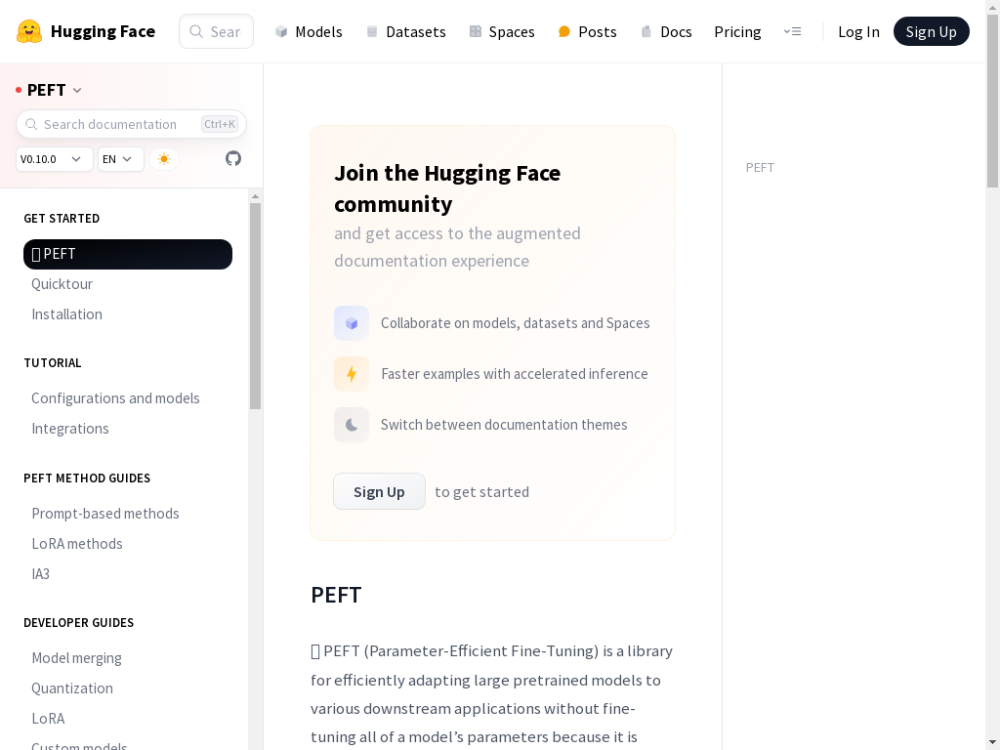

Thoughts: Thought:
- The current screenshot shows the documentation page for PEFT (Parameter-Efficient Fine-Tuning) on the Hugging Face website.
- The left sidebar of the page contains various sections including "GET STARTED", "TUTORIAL", and "PEFT METHOD GUIDES".
- Under the "GET STARTED" section, there is an option labeled "Quicktour", which is likely a brief guide or introduction to PEFT.
- Since the objective is to go on the quick tour of PEFT, the next logical step is to access this section.

Instruction: Click on 'Quicktour' under the 'GET STARTED' section in the left sidebar.


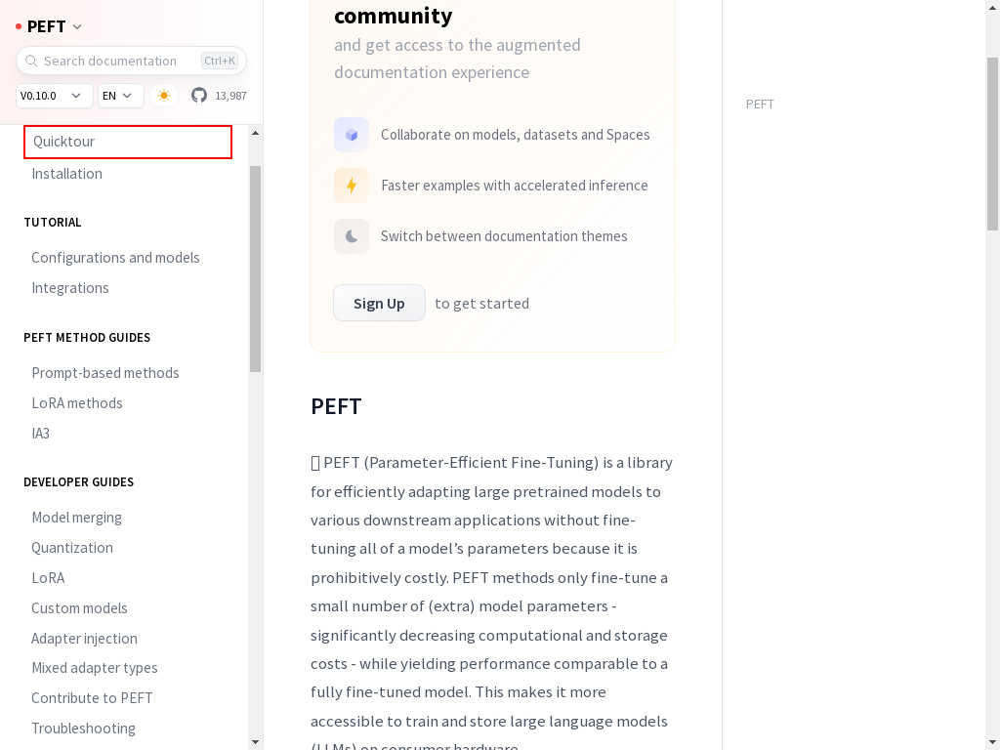

# Let's proceed step by step.
# First we need to identify the 'Quicktour' link under the 'GET STARTED' section in the left sidebar.

# Based on the HTML provided, we can identify the 'Quicktour' link by its id "quicktour"
quicktour_link = driver.find_element(By.XPATH, """//*[contains(@id,"quicktour")]""")

# Then we can click on it
quicktour_link.click()


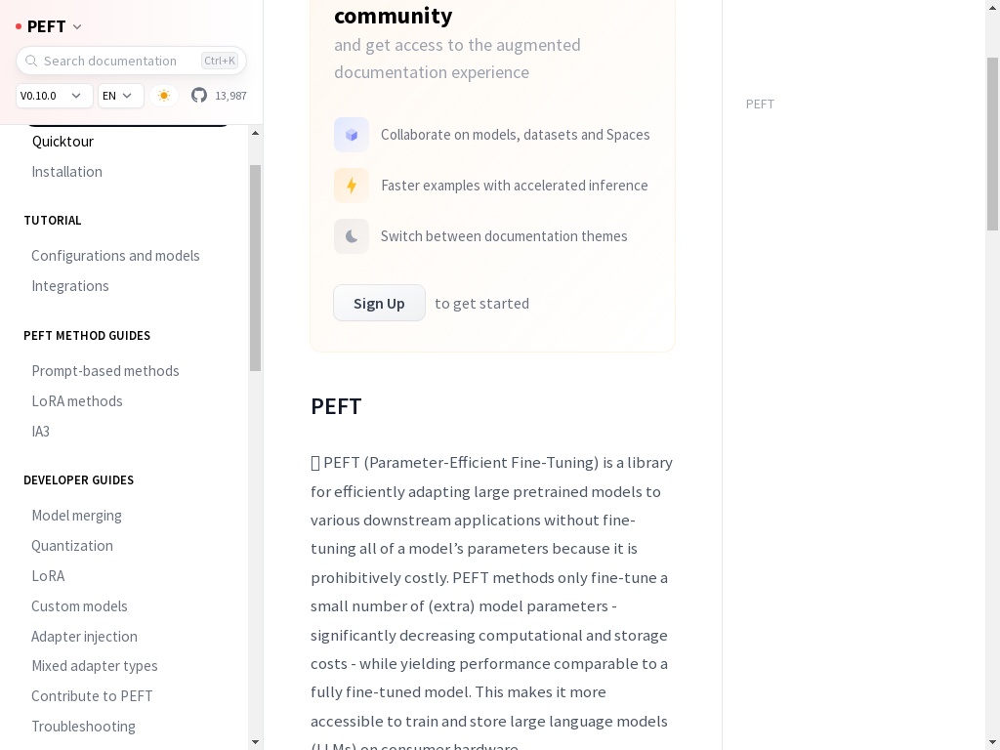

 40%|████      | 2/5 [00:42<01:01, 20.52s/it]

Step ended


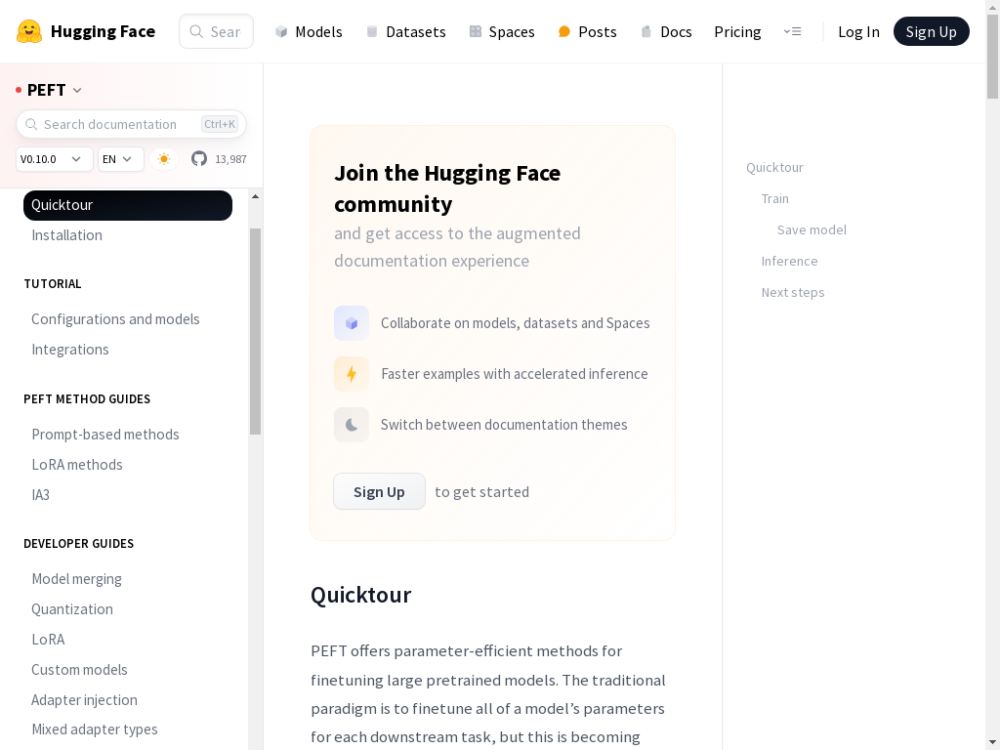

Thoughts: Thought:
- The current screenshot shows the documentation page for PEFT on the Hugging Face website.
- The left sidebar clearly lists various sections of the PEFT documentation, including "Quicktour."
- The objective is to go on the quicktour of PEFT, and the "Quicktour" link is visible on the left sidebar.
- Clicking on this link will likely lead to a detailed overview or guide related to PEFT.

Instruction: Click on 'Quicktour' in the left sidebar under the PEFT section.


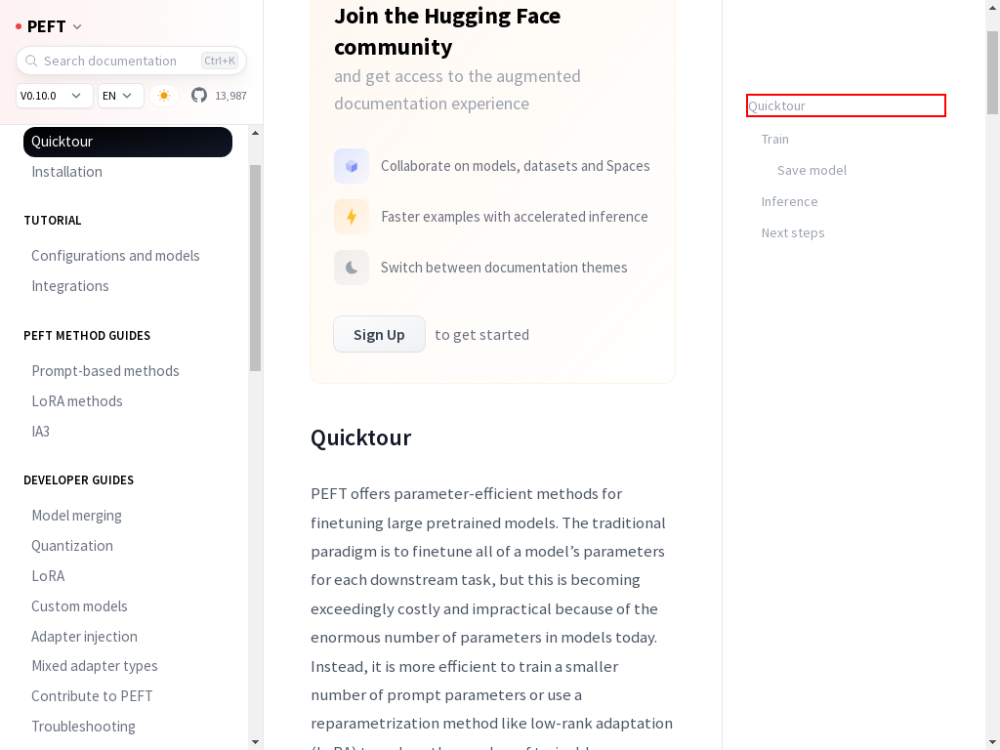

# Let's proceed step by step.
# First we need to identify the 'Quicktour' link in the left sidebar under the PEFT section, then we can click on it.

# Based on the HTML provided, we need to devise the best strategy to select the link.
# The 'Quicktour' link can be identified using the id "nav-quicktour" which is unique.
quicktour_link = driver.find_element(By.XPATH, """//*[contains(@id,"nav-quicktour")]""")

# Then we can click on it
quicktour_link.click()


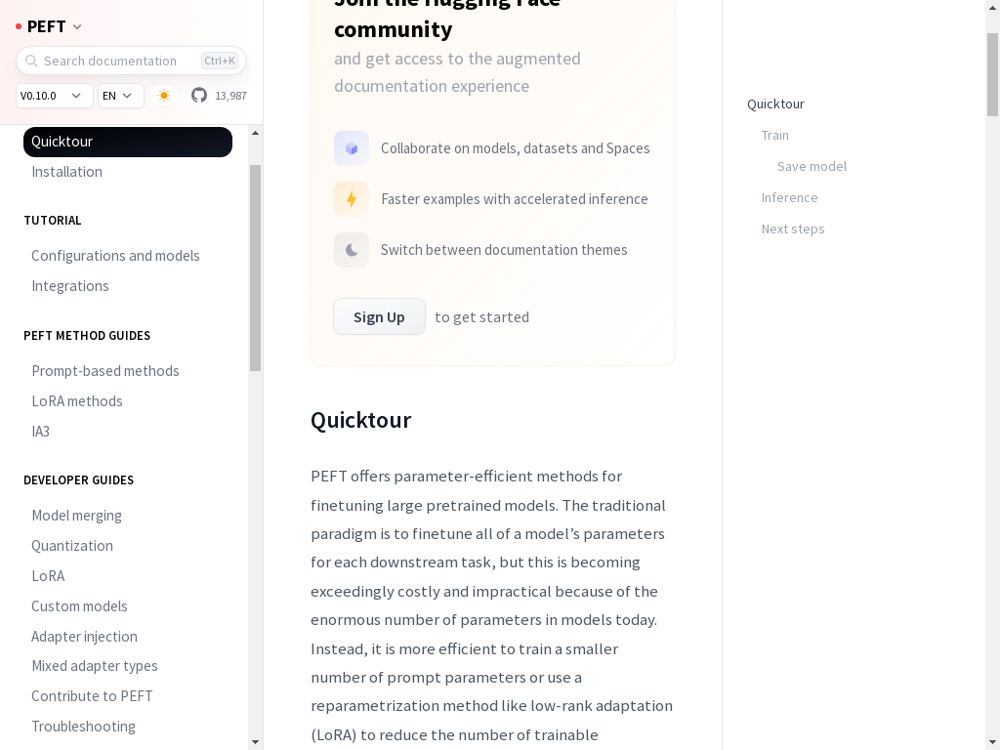

 60%|██████    | 3/5 [01:01<00:39, 19.57s/it]

Step ended


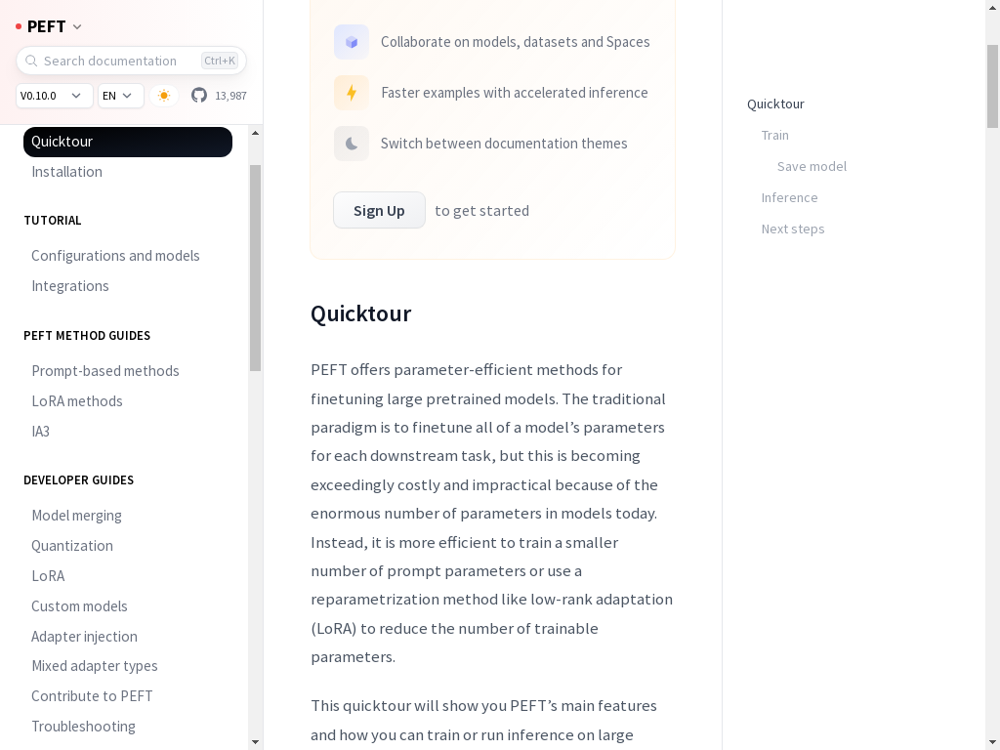

 60%|██████    | 3/5 [01:07<00:44, 22.42s/it]

Thoughts: Thought:
- The current screenshot shows the documentation page for PEFT (Parameter-Efficient Fine-Tuning).
- The left sidebar of the page has a menu with various sections including "Quicktour".
- The objective is to go on the quicktour of PEFT, and the "Quicktour" section is already visible and highlighted in the sidebar.
- Since the "Quicktour" section is already selected, the main content area of the page is likely displaying the quicktour information.

Instruction: STOP
Finished


In [13]:
from tqdm import tqdm
from lavague.defaults import DefaultLLM

model = "gpt-4-1106-preview"

llm = DefaultLLM(model=model)

opsm_retriever = OpsmSplitRetriever(embedder, top_k=3)
action_engine = ActionEngine(llm, opsm_retriever)

objective = "Go on the quicktour of PEFT"

driver.get("https://huggingface.co/docs")
N_retry = 10
N_steps = 5

for i in tqdm(range(N_steps)):
    display_screenshot(driver)
    
    state = encode_image("screenshot.png")
    output = world_model.get_instruction(state, objective)
    
    instruction = extract_instruction(output)
    print("Thoughts:", output)
    if instruction != "STOP":
        query = instruction
        html = driver.page_source

        nodes = action_engine.get_nodes(query, html)
        context = "\n".join(nodes)
        for _ in range(N_retry):
            try:
                action = action_engine.action_from_context(context, query)
                screenshot_before_action = get_highlighted_element(action, driver)
                display(screenshot_before_action)
                
                exec(action)
                print(action)
                display_screenshot(driver)
                break
                
            except Exception as e:
                print("Code execution failed. Retrying...")
                pass
        print("Step ended")
    else:
        print("Finished")
        break

  0%|          | 0/5 [00:00<?, ?it/s]

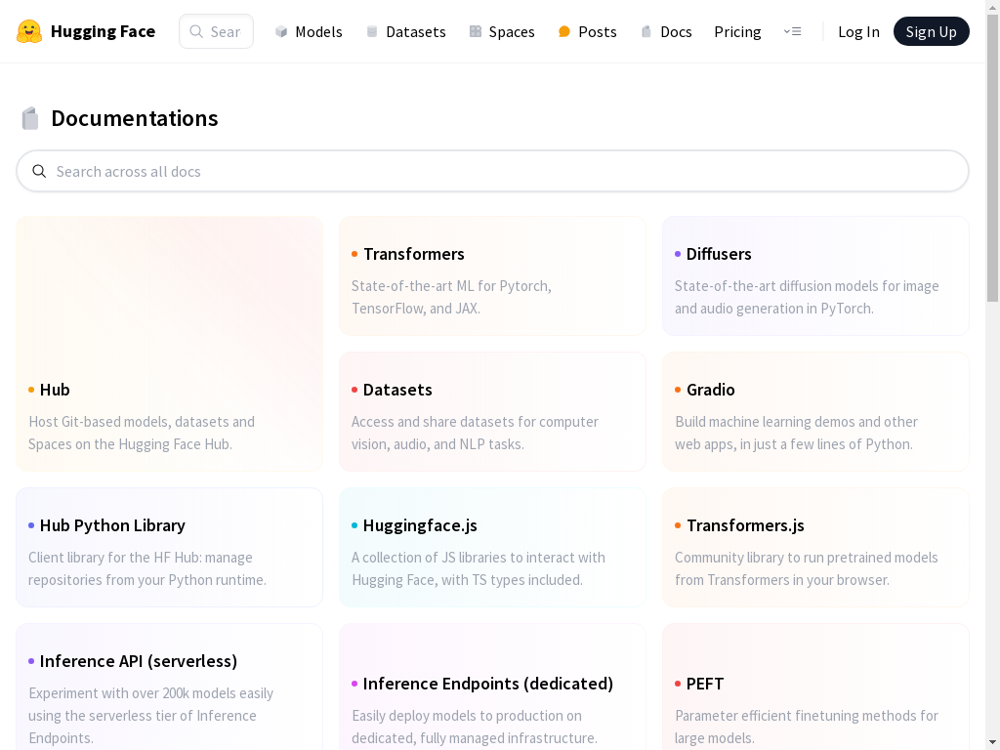

Thoughts: Thought:
- The current screenshot shows the Documentation page of the Hugging Face website.
- The page includes various sections such as Transformers, Datasets, Diffusers, and more.
- The objective is to go on the quick tour of Diffusers.
- The Diffusers section is visible on the right side of the page, suggesting it contains more detailed information about Diffusers, potentially including a quick tour.

Instruction: Click on 'Diffusers' in the right section of the page.


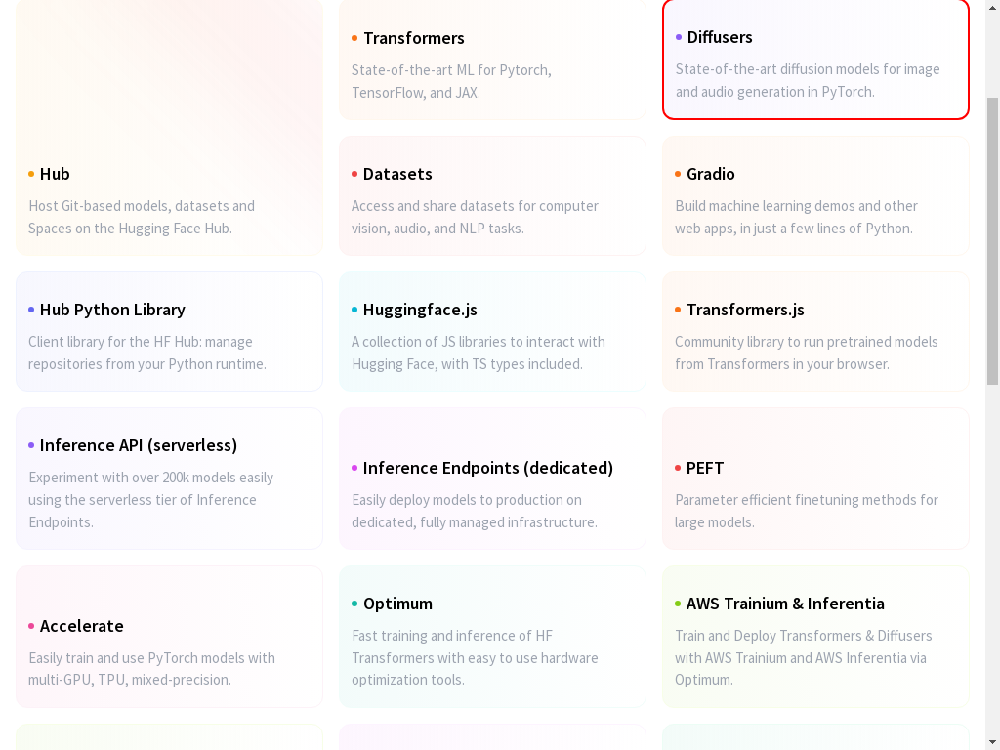

# Let's proceed step by step.
# First we need to identify the link that contains the text 'Diffusers' in the right section of the page, then we can click on it.

# Based on the HTML provided, we can identify the link by the text 'Diffusers' and its position in the grid.
# We can use the class "group" to identify the section and then find the link with the text 'Diffusers'.
diffusers_link = driver.find_element(By.XPATH, """//*[contains(@class,"group")][contains(.,'Diffusers')][contains(@href,"/docs/diffusers")]""")

# Then we can click on the link
diffusers_link.click()


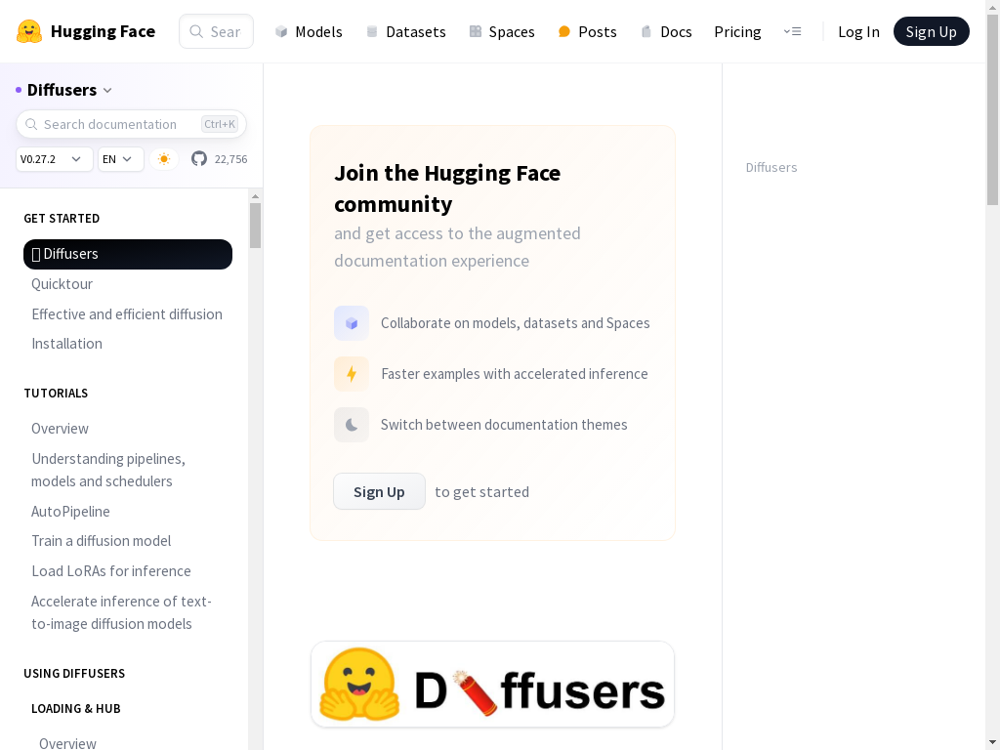

 20%|██        | 1/5 [00:19<01:18, 19.53s/it]

Step ended


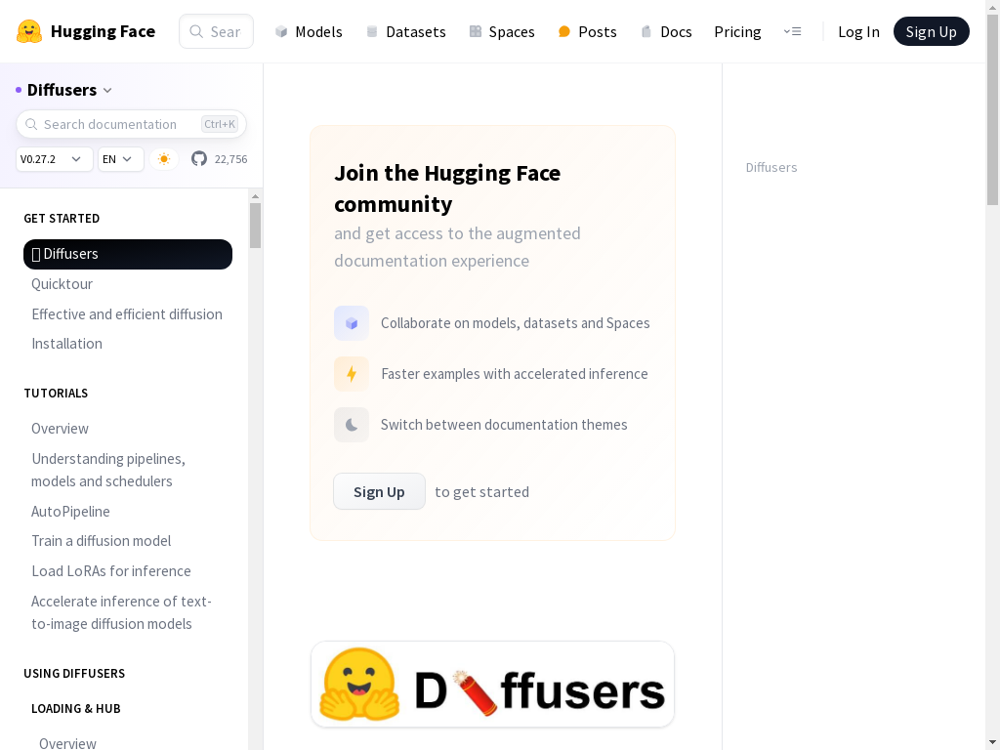

Thoughts: Thought:
- The current screenshot shows the homepage of the Diffusers section on the Hugging Face website.
- The left sidebar contains various links under the "GET STARTED" and "TUTORIALS" sections.
- The objective is to go on the quick tour of Diffusers, and the link labeled "Quicktour" is visible under the "GET STARTED" section in the left sidebar.
- This indicates that the quick tour can be accessed directly by clicking on this link.

Instruction: Click on 'Quicktour' under the 'GET STARTED' section in the left sidebar.
Code execution failed. Retrying...


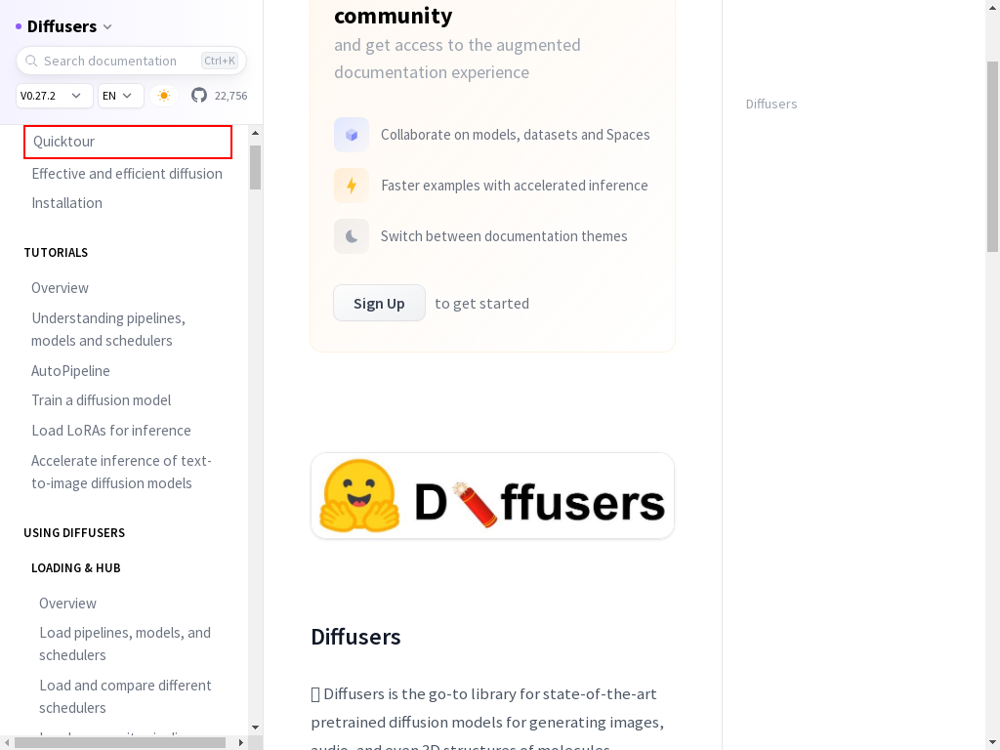

# Let's proceed step by step.
# First we need to identify the 'Quicktour' link under the 'GET STARTED' section in the left sidebar, then we can click on it.

# Based on the HTML provided, we need to devise the best strategy to select the link.
# The 'Quicktour' link can be identified using the id "quicktour" and it is unique in the context of the 'GET STARTED' section.
quicktour_link = driver.find_element(By.XPATH, """//*[contains(@id,"quicktour")][contains(@href,"/docs/diffusers/quicktour")]""")

# Then we can click on it
quicktour_link.click()


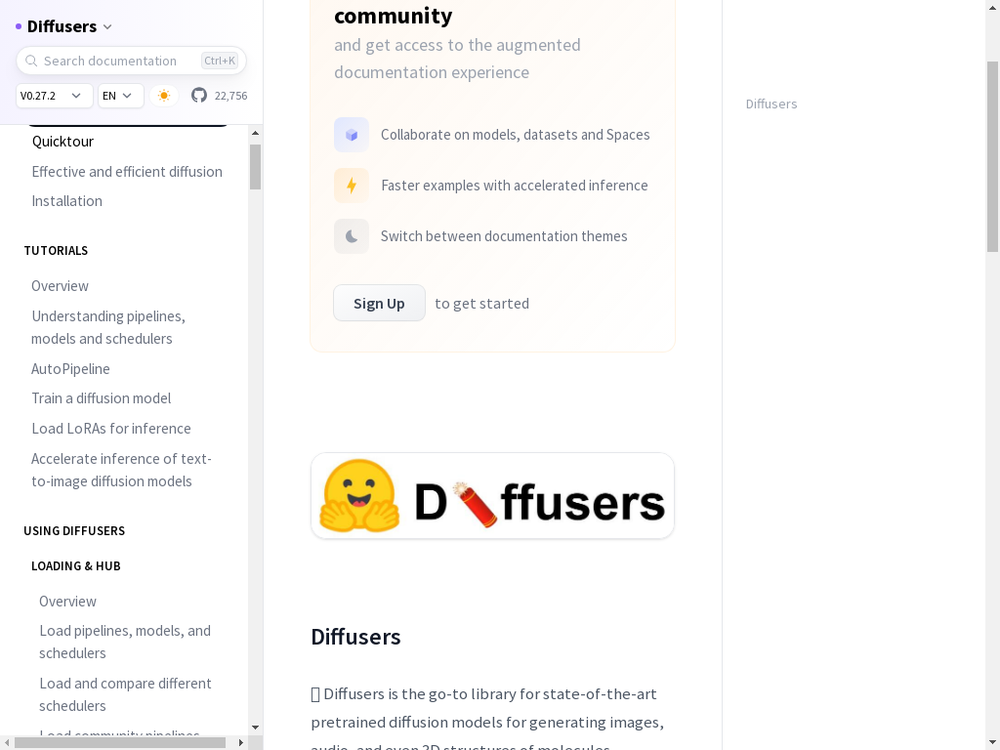

 40%|████      | 2/5 [00:49<01:16, 25.56s/it]

Step ended


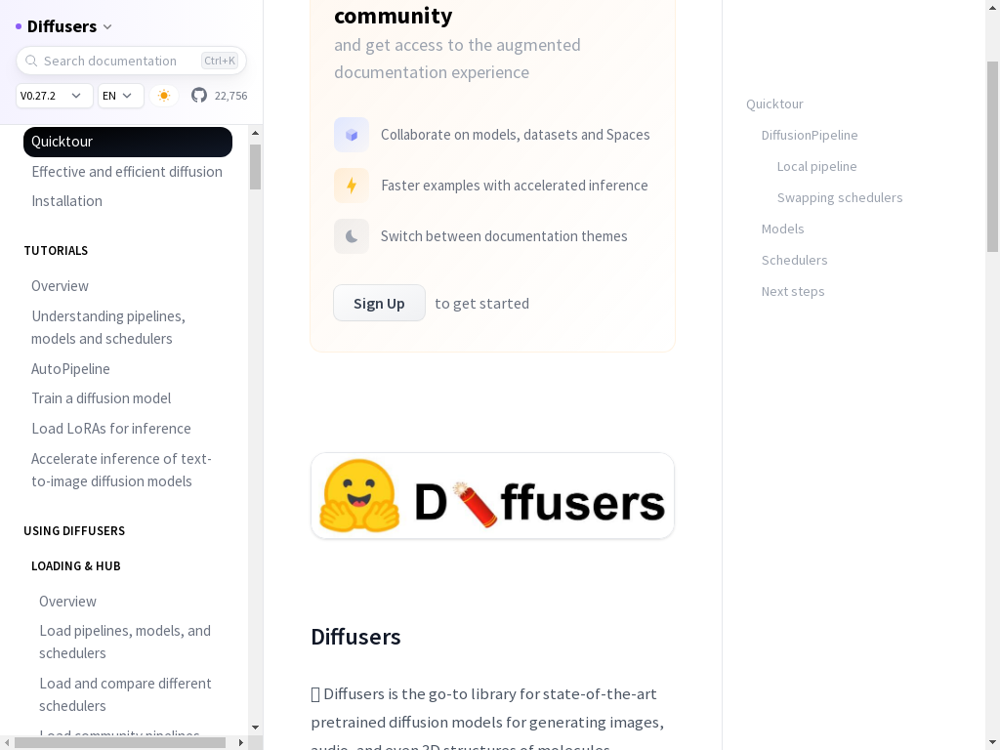

 40%|████      | 2/5 [00:58<01:27, 29.11s/it]

Thoughts: Thought:
- The current screenshot shows the documentation page for the Diffusers library on a website.
- The left sidebar clearly lists various sections of the documentation, including "Quicktour".
- The "Quicktour" section is visible and highlighted, indicating it is currently selected.
- The main content area should now display the Quicktour content, fulfilling the objective to go on the quicktour of Diffusers.

Instruction: STOP
Finished


In [16]:
from tqdm import tqdm

objective = "Go on the quicktour of Diffusers"
driver.get("https://huggingface.co/docs")
N_retry = 3
N_steps = 5

for i in tqdm(range(N_steps)):
    display_screenshot(driver)
    
    state = encode_image("screenshot.png")
    output = world_model.get_instruction(state, objective)
    
    instruction = extract_instruction(output)
    print("Thoughts:", output)
    if instruction != "STOP":
        query = instruction
        html = driver.page_source

        nodes = action_engine.get_nodes(query, html)
        context = "\n".join(nodes)
        for _ in range(N_retry):
            try:
                action = action_engine.action_from_context(context, query)
                screenshot_before_action = get_highlighted_element(action, driver)
                display(screenshot_before_action)
                
                exec(action)
                print(action)
                display_screenshot(driver)
                break
                
            except Exception as e:
                print("Code execution failed. Retrying...")
                pass
        print("Step ended")
    else:
        print("Finished")
        break


In [ ]:
from tqdm import tqdm

objective = "Go on the Install page of Diffusers"
driver.get("https://huggingface.co/docs")
N_retry = 3
N_steps = 5

for i in tqdm(range(N_steps)):
    display_screenshot(driver)
    
    state = encode_image("screenshot.png")
    output = world_model.get_instruction(state, objective)
    
    instruction = extract_instruction(output)
    print("Thoughts:", output)
    if instruction != "STOP":
        query = instruction
        html = driver.page_source

        nodes = action_engine.get_nodes(query, html)
        context = "\n".join(nodes)
        for _ in range(N_retry):
            try:
                action = action_engine.action_from_context(context, query)
                screenshot_before_action = get_highlighted_element(action, driver)
                display(screenshot_before_action)
                
                exec(action)
                print(action)
                display_screenshot(driver)
                break
                
            except Exception as e:
                print("Code execution failed. Retrying...")
                pass
        print("Step ended")
    else:
        print("Finished")
        break


In [13]:
from IPython.display import display, HTML, Code

for node in nodes:
    display(HTML(node))
    display(Code(node, language='python'))

<div class="SVELTE_HYDRATER contents" data-target="SSOBanner" data-props="{}"></div>
	

	<main class="flex flex-1 flex-col"><div class="container grid max-w-6xl pb-12 pt-10"><h1 class="mb-4 flex items-center text-2xl font-semibold"><svg xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink" aria-hidden="true" role="img" class="mr-1.5 text-gray-400 text-3xl" width="1em" height="1em" preserveAspectRatio="xMidYMid meet" viewBox="0 0 32 32"><path opacity="0.5" d="M20.9022 5.10334L10.8012 10.8791L7.76318 9.11193C8.07741 8.56791 8.5256 8.11332 9.06512 7.7914L15.9336 3.73907C17.0868 3.08811 18.5002 3.26422 19.6534 3.91519L19.3859 3.73911C19.9253 4.06087 20.5879 4.56025 20.9022 5.10334Z" fill="currentColor"></path><path d="M10.7999 10.8792V28.5483C10.2136 28.5475 9.63494 28.4139 9.10745 28.1578C8.5429 27.8312 8.074 27.3621 7.74761 26.7975C7.42122 26.2327 7.24878 25.5923 7.24756 24.9402V10.9908C7.25062 10.3319 7.42358 9.68487 7.74973 9.1123L10.7999 10.8792Z" fill="currentColor" fill-opacity="0.75"></path><path fill-rule="evenodd" clip-rule="evenodd" d="M21.3368 10.8499V6.918C21.3331 6.25959 21.16 5.61234 20.8346 5.03949L10.7971 10.8727L10.8046 10.874L21.3368 10.8499Z" fill="currentColor"></path><path opacity="0.5" d="M21.7937 10.8488L10.7825 10.8741V28.5486L21.7937 28.5234C23.3344 28.5234 24.5835 27.2743 24.5835 25.7335V13.6387C24.5835 12.0979 23.4365 11.1233 21.7937 10.8488Z" fill="currentColor"></path></svg>
			Documentations
		</h1>

		
		<div class="relative mb-6"><svg class="absolute z-10 left-4 top-3.5 pointer-events-none" xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink" aria-hidden="true" focusable="false" role="img" width="1em" height="1em" preserveAspectRatio="xMidYMid meet" viewBox="0 0 32 32"><path d="M30 28.59L22.45 21A11 11 0 1 0 21 22.45L28.59 30zM5 14a9 9 0 1 1 9 9a9 9 0 0 1-9-9z" fill="currentColor"></path></svg>
			<div class="docs-searchbar-js" data-ds-theme="dark"><span class="meilisearch-autocomplete" style="position: relative; display: inline-block; direction: ltr;"><input class="form-input js-docs-searchbar !mt-0 w-full !rounded-full pl-10 pr-4 dsb-input" placeholder="Search across all docs" type="text" autocomplete="off" spellcheck="false" role="combobox" aria-autocomplete="list" aria-expanded="false" aria-label="search input" aria-owns="meilisearch-autocomplete-listbox-0" dir="auto" style="position: relative; vertical-align: top;"><pre aria-hidden="true" style="position: absolute; visibility: hidden; white-space: pre; font-family: &quot;Source Sans Pro&quot;, ui-sans-serif, system-ui, sans-serif, &quot;Apple Color Emoji&quot;, &quot;Segoe UI Emoji&quot;, &quot;Segoe UI Symbol&quot;, &quot;Noto Color Emoji&quot;; font-size: 16px; font-style: normal; font-variant: normal; font-weight: 400; word-spacing: 0px; letter-spacing: normal; text-indent: 0px; text-rendering: auto; text-transform: none;"></pre><span class="dsb-dropdown-menu" role="listbox" id="meilisearch-autocomplete-listbox-0" style="position: absolute; top: 100%; z-index: 100; display: none;">

<div class="absolute hidden h-16 w-[550px] rotate-45 transform bg-red-500/10 blur-3xl transition-transform group-first:block group-hover:-translate-y-24 dark:bg-white/10 md:h-24"></div>
					<div class="relative mb-2 mt-auto flex items-center text-lg font-semibold"><span class="mr-1.5 h-1.5 w-1.5 rounded-full bg-orange-500"></span>
						<span class="group-hover:underline">Transformers.js</span></div>
					<div class="relative pr-4 text-smd font-normal text-gray-400">Community library to run pretrained models from Transformers in your browser.</div>
				</a>
				<a href="/docs/api-inference" target="_self" class="group group relative flex flex-col overflow-hidden border md:first:row-span-2 border-purple-50 2x:pt-10 rounded-xl bg-gradient-to-r px-3 pb-4 pt-6 dark:border-gray-900 from-purple-500/5 hover:shadow-alternate to-white shadow-none transition-shadow dark:from-gray-850 dark:to-gray-950 dark:hover:from-gray-800"><div class="absolute hidden h-16 w-[550px] rotate-45 transform bg-red-500/10 blur-3xl transition-transform group-first:block group-hover:-translate-y-24 dark:bg-white/10 md:h-24"></div>
					<div class="relative mb-2 mt-auto flex items-center text-lg font-semibold"><span class="mr-1.5 h-1.5 w-1.5 rounded-full bg-purple-500"></span>
						<span class="group-hover:underline">Inference API (serverless)</span></div>
					<div class="relative pr-4 text-smd font-normal text-gray-400">Experiment with over 200k models easily using the serverless tier of Inference Endpoints.</div>
				</a>
				<a href="/docs/inference-endpoints" target="_self" class="group group relative flex flex-col overflow-hidden border md:first:row-span-2 border-fuchsia-50 2x:pt-10 rounded-xl bg-gradient-to-r px-3 pb-4 pt-6 dark:border-gray-900 from-fuchsia-500/5 hover:shadow-alternate to-white shadow-none transition-shadow dark:from-gray-850 dark:to-gray-950 dark:hover:from-gray-800"><div class="absolute hidden h-16 w-[550px] rotate-45 transform bg-red-500/10 blur-3xl transition-transform group-first:block group-hover:-translate-y-24 dark:bg-white/10 md:h-24"></div>
					<div class="relative mb-2 mt-auto flex items-center text-lg font-semibold"><span class="mr-1.5 h-1.5 w-1.5 rounded-full bg-fuchsia-500"></span>
						<span class="group-hover:underline">Inference Endpoints (dedicated)</span></div>
					<div class="relative pr-4 text-smd font-normal text-gray-400">Easily deploy models to production on dedicated, fully managed infrastructure.</div>
				</a>
				<a href="/docs/peft" target="_self" class="group group relative flex flex-col overflow-hidden border md:first:row-span-2 border-red-50 2x:pt-10 rounded-xl bg-gradient-to-r px-3 pb-4 pt-6 dark:border-gray-900 from-red-500/5 hover:shadow-alternate to-white shadow-none transition-shadow dark:from-gray-850 dark:to-gray-950 dark:hover:from-gray-800"><div class="absolute hidden h-16 w-[550px] rotate-45 transform bg-red-500/10 blur-3xl transition-transform group-first:block group-hover:-translate-y-24 dark:bg-white/10 md:h-24"></div>
					<div class="relative mb-2 mt-auto flex items-center text-lg font-semibold"><span class="mr-1.5 h-1.5 w-1.5 rounded-full bg-red-500"></span>
						<span class="group-hover:underline">PEFT</span></div>
					<div class="relative pr-4 text-smd font-normal text-gray-400">Parameter efficient finetuning methods for large models.</div>
				</a>
				<a href="/docs/accelerate" target="_self" class="group group relative flex flex-col overflow-hidden border md:first:row-span-2 border-pink-50 2x:pt-10 rounded-xl bg-gradient-to-r px-3 pb-4 pt-6 dark:border-gray-900 from-pink-500/5 hover:shadow-alternate to-white shadow-none transition-shadow dark:from-gray-850 dark:to-gray-950 dark:hover:from-gray-800"><div class="absolute hidden h-16 w-[550px] rotate-45 transform bg-red-500/10 blur-3xl transition-transform group-first:block group-hover:-translate-y-24 dark:bg-white/10 md:h-24"></div>

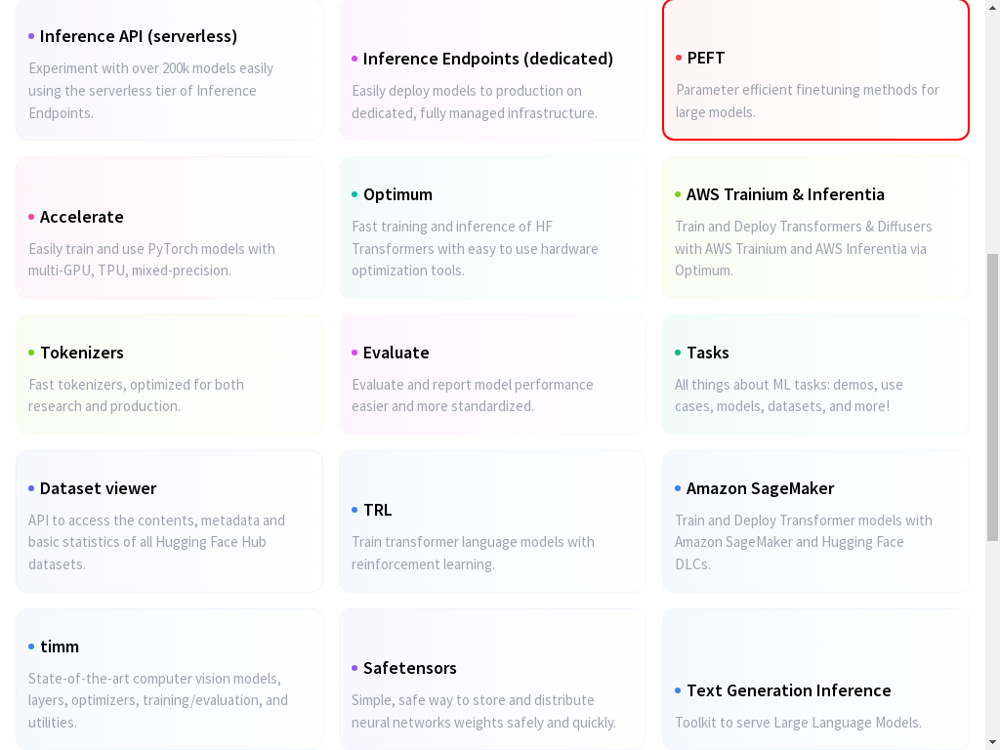

In [34]:
print("Hello ")

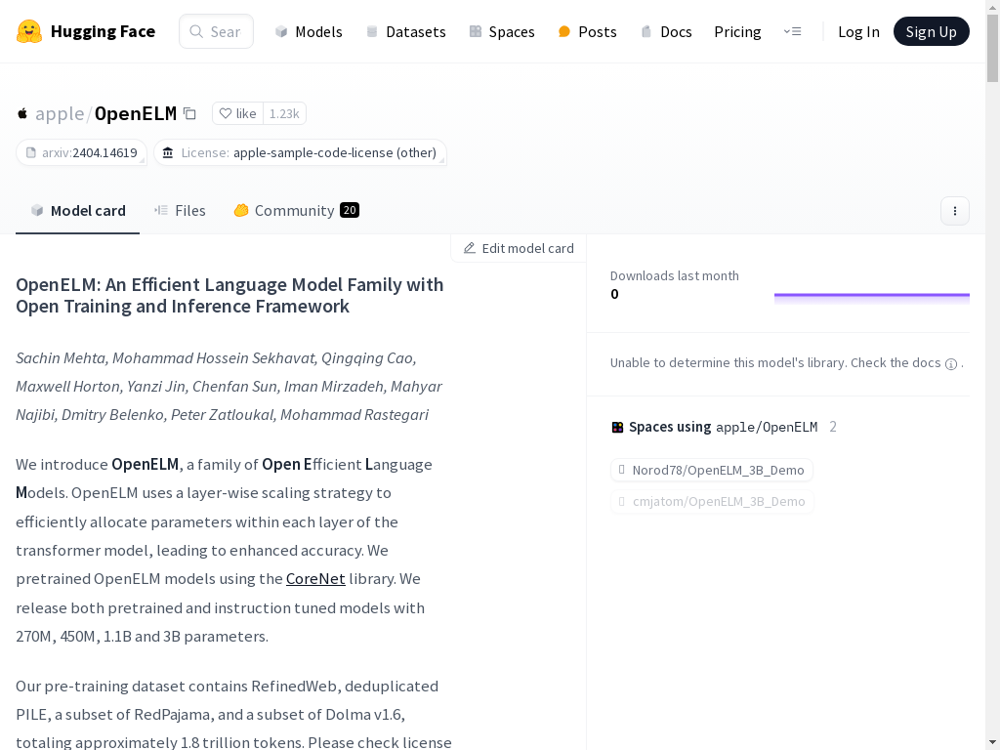

In [6]:
driver.get("https://huggingface.co/apple/OpenELM")
driver.save_screenshot("screenshot.png") 
display(Image("screenshot.png"))

/home/daniel/miniconda3/envs/lavague/lib/python3.10/site-packages/tree_sitter/__init__.py:36: FutureWarning: Language(path, name) is deprecated. Use Language(ptr, name) instead.
  warn("{} is deprecated. Use {} instead.".format(old, new), FutureWarning)


# Let's proceed step by step.
# First we need to identify the code block that contains the installation instructions.

# Based on the HTML provided, we can identify the code block by its class "language-bash"
code_block = driver.find_element(By.XPATH, """//*[contains(@class,"language-bash")]""")

# Now we can print the text inside the code block
print(code_block.text)
# install public lm-eval-harness

harness_repo="public-lm-eval-harness"
git clone https://github.com/EleutherAI/lm-evaluation-harness ${harness_repo}
cd ${harness_repo}
# use main branch on 03-15-2024, SHA is dc90fec
git checkout dc90fec
pip install -e .
cd ..

# 66d6242 is the main branch on 2024-04-01 
pip install datasets@git+https://github.com/huggingface/datasets.git@66d6242
pip install tokenizers>=0.15.2 transformers>=4.38.2 sentencepiece>=0.2.0


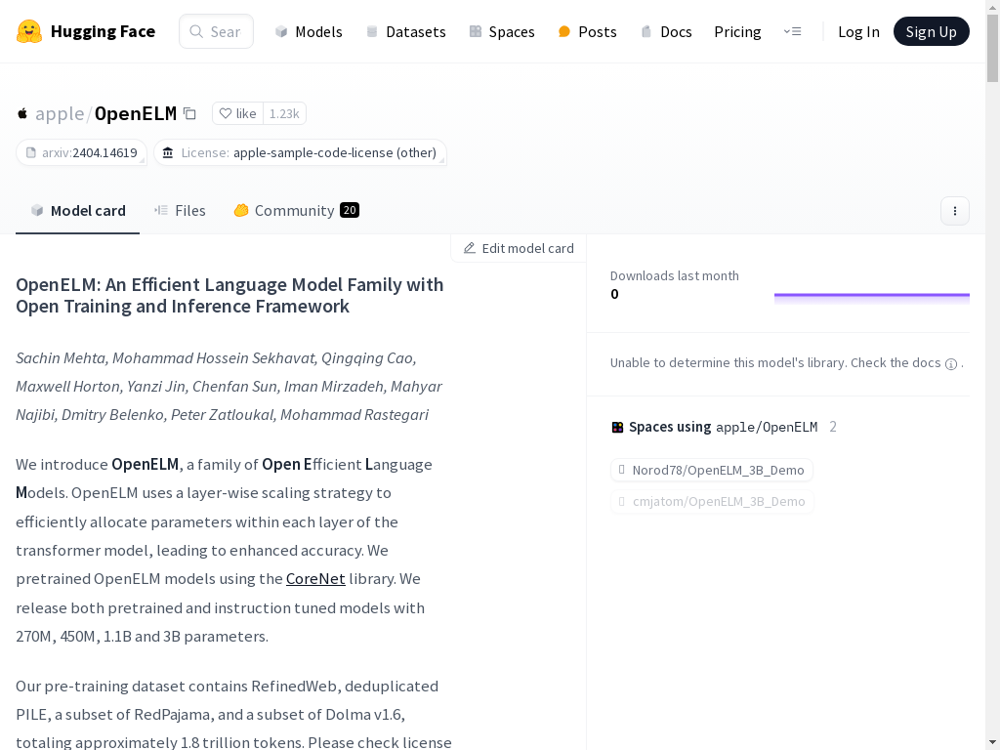

In [7]:
query = "Print the code showing how to install the dependencies"
html = driver.page_source

nodes = action_engine.get_nodes(query, html)
context = "\n".join(nodes)
action = action_engine.action_from_context(context, query)
print(action)

exec(action)
driver.save_screenshot("screenshot.png")
display(Image("screenshot.png"))

In [ ]:
print()

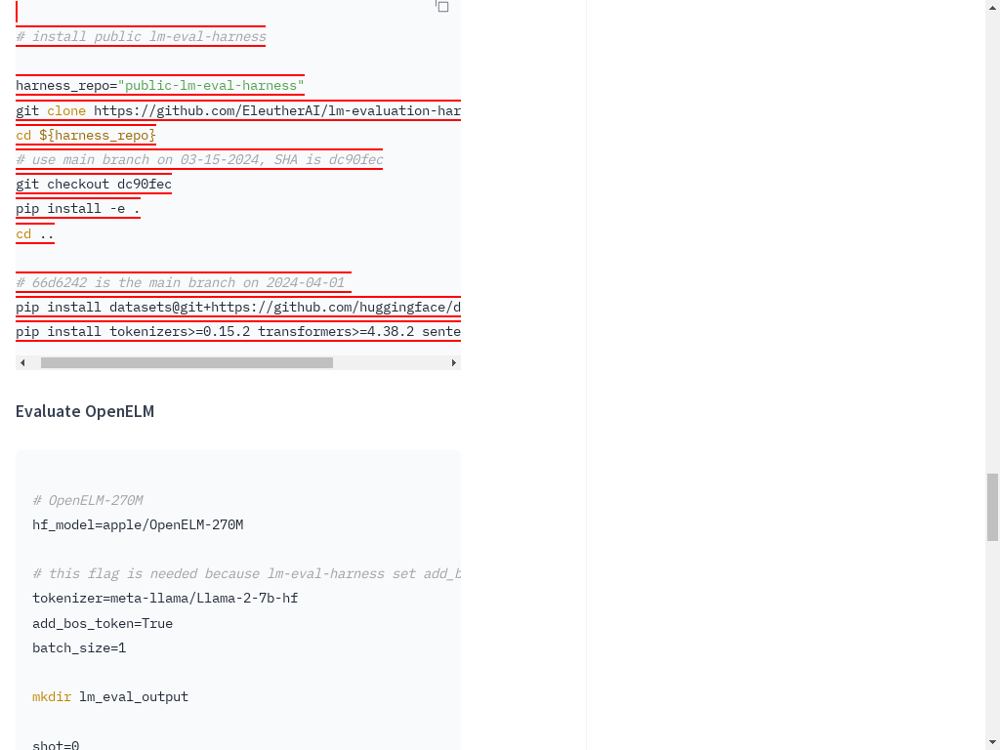

In [15]:


image = get_highlighted_element(action, driver)
display(image)

In [14]:
# Let's proceed step by step.
# First we need to identify the code block that contains the installation instructions.

# Based on the HTML provided, we can identify the code block by its class "language-bash"
code_block = driver.find_element(By.XPATH, """//*[contains(@class,"language-bash")]""")

# Now we can print the text inside the code block
print(code_block.text)

# install public lm-eval-harness

harness_repo="public-lm-eval-harness"
git clone https://github.com/EleutherAI/lm-evaluation-harness ${harness_repo}
cd ${harness_repo}
# use main branch on 03-15-2024, SHA is dc90fec
git checkout dc90fec
pip install -e .
cd ..

# 66d6242 is the main branch on 2024-04-01 
pip install datasets@git+https://github.com/huggingface/datasets.git@66d6242
pip install tokenizers>=0.15.2 transformers>=4.38.2 sentencepiece>=0.2.0


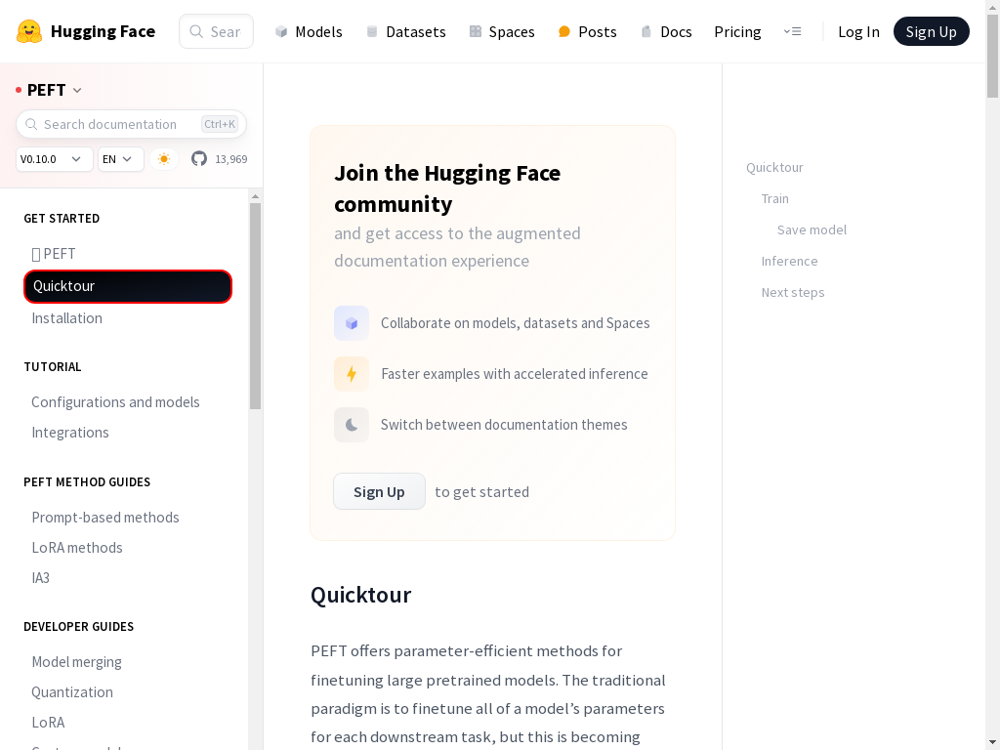

In [12]:
quicktour_link = driver.find_element(By.XPATH, """//*[contains(@id,"quicktour")][contains(@href,"/docs/peft/quicktour")][contains(text(),"Quicktour")]""")

highlight_element(driver, quicktour_link)

In [16]:
from IPython.display import HTML, display, Code

for node in nodes:
    display(HTML(node))

/home/daniel/miniconda3/envs/lavague/lib/python3.10/site-packages/tree_sitter/__init__.py:36: FutureWarning: Language(path, name) is deprecated. Use Language(ptr, name) instead.
  warn("{} is deprecated. Use {} instead.".format(old, new), FutureWarning)


# Let's proceed step by step.
# First we need to identify the 'PEFT' section, then we can click on it.

# Based on the HTML provided, we can identify the 'PEFT' section by the text content 'PEFT'.
# We will use the text content along with other attributes to make sure we target the element precisely.
peft_section = driver.find_element(By.XPATH, """//*[contains(@href,"/docs/peft")][contains(@class,"group")][contains(@class,"relative")][contains(@class,"flex")][contains(@class,"flex-col")][contains(@class,"overflow-hidden")][contains(@class,"border")][contains(@class,"rounded-xl")][contains(@class,"bg-gradient-to-r")][contains(@class,"px-3")][contains(@class,"pb-4")][contains(@class,"pt-6")][contains(@class,"dark:border-gray-900")][contains(@class,"from-red-500/5")][contains(@class,"hover:shadow-alternate")][contains(@class,"to-white")][contains(@class,"shadow-none")][contains(@class,"transition-shadow")][contains(@class,"dark:from-gray-850")][contains(@class,"dark:to-gray-950")][contain

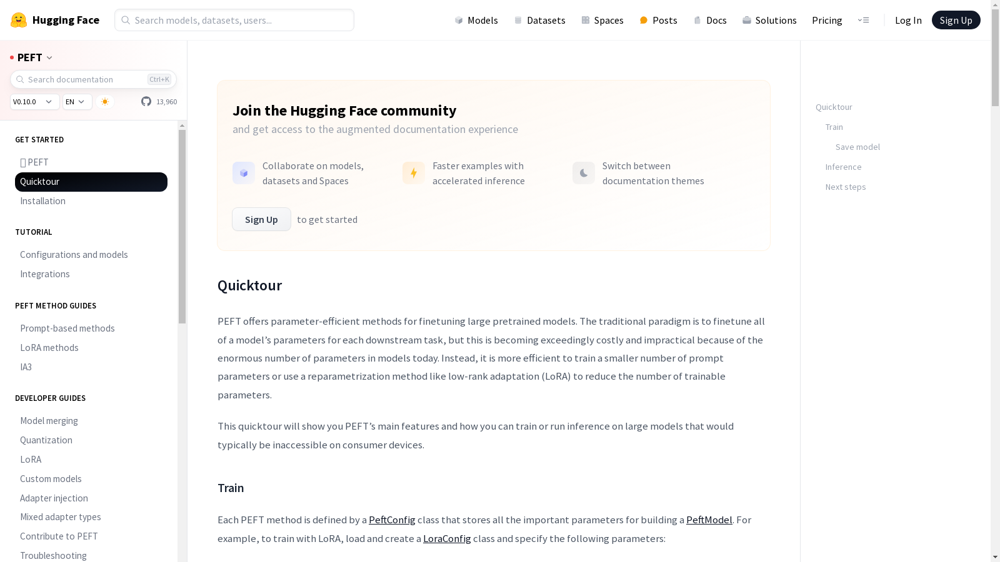

In [19]:
driver.save_screenshot("screenshot.png")
display(Image("screenshot.png"))

In [34]:
query = "Select the text under the 'Quicktour' title and print it"
html = driver.page_source

nodes = action_engine.get_nodes(query, html)
context= "\n".join(nodes)
action = action_engine.action_from_context(context, query)
print(action)

/home/daniel/miniconda3/envs/lavague/lib/python3.10/site-packages/tree_sitter/__init__.py:36: FutureWarning: Language(path, name) is deprecated. Use Language(ptr, name) instead.
  warn("{} is deprecated. Use {} instead.".format(old, new), FutureWarning)


# Let's proceed step by step.
# First we need to identify the element containing the text under the 'Quicktour' title.

# Based on the HTML snippet provided, we can identify the 'Quicktour' title by its href attribute and id.
quicktour_element = driver.find_element(By.XPATH, """//*[contains(@href,"#quicktour")][contains(@id,"nav-quicktour")]""")

# Now we need to get the text from this element.
quicktour_text = quicktour_element.text

# Finally, we print the text.
print(quicktour_text)


In [7]:
from IPython.display import HTML, Code

for node in nodes:
    display(HTML(node))
    display(Code(node, language="html"))

th class="origin-bottom-right transition-transform group-hover:-rotate-6" d=

th class="origin-bottom-left transition-transform group-hover:rotate-6" d=

th class="origin-bottom-right transition-transform group-hover:-rotate-6" d="M38.5967 76.6898C41.3487 72.6538 41.1537 69.6248 37.3777 65.8508C33.6017 62.0778 31.4037 56.5578 31.4037 56.5578C31.4037 56.5578 30.5827 53.3518 28.7127 53.6468C26.8427 53.9418 25.4697 58.7328 29.3867 61.6638C33.3037 64.5938 28.6067 66.5848 27.0997 63.8328C25.5927 61.0808 21.4777 54.0058 19.3437 52.6528C17.2107 51.2998 15.7087 52.0578 16.2117 54.8468C16.7147 57.6358 25.6357 64.3958 24.7677 65.8588C23.8997 67.3208 20.8407 64.1398 20.8407 64.1398C20.8407 64.1398 11.2687 55.4288 9.18465 57.6988C7.10065 59.9688 10.7657 61.8708 15.9887 65.0328C21.2127 68.1938 21.6177 69.0288 20.8767 70.2248C20.1347 71.4208 8.60465 61.6998 7.52165 65.8208C6.43965 69.9418 19.2887 71.1378 18.4957 73.9828C17.7027 76.8288 9.44465 68.5978 7.75565 71.8048C6.06565 75.0128 19.4087 78.7818 19.5167 78.8098C23.8267 79.9278 34.7727 82.2968 38.5967 76.6898Z" fill="#FFD21E"></path><pa

In [35]:
quicktour_element = driver.find_element(By.XPATH, """//*[contains(@href,"#quicktour")][contains(@id,"nav-quicktour")]""")

# Now we need to get the text from this element.
quicktour_text = quicktour_element.text

# Finally, we print the text.
print(quicktour_text)


Quicktour


In [29]:
quicktour_title = driver.find_element(By.XPATH, """//*[contains(@href,"#quicktour")][contains(@id,"nav-quicktour")]""")

# Now we need to get the text of the element. We can use the .text property to retrieve it.
quicktour_text = quicktour_title.text

# Finally, we print the text.
print(quicktour_text)

Quicktour


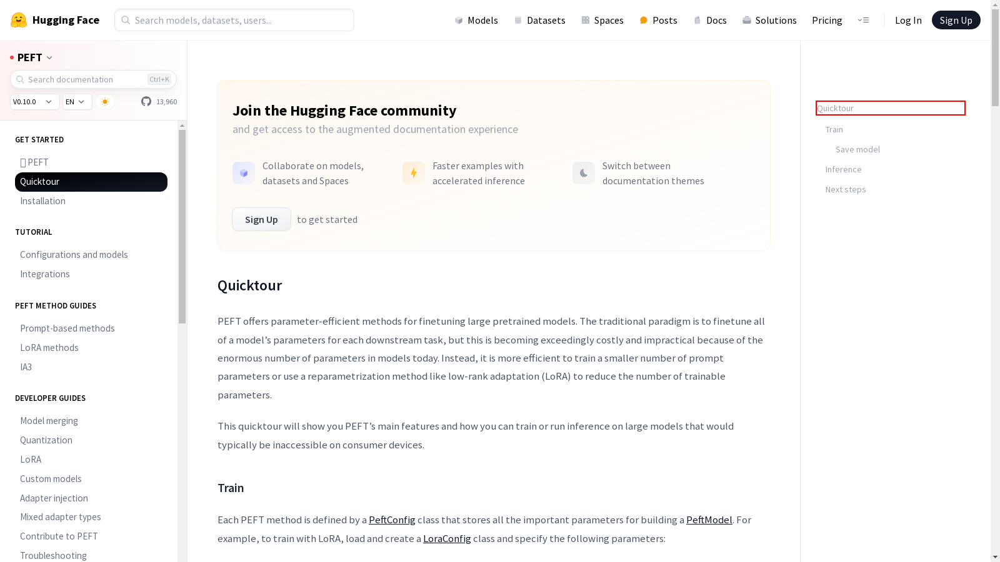

In [27]:
highlight_element(driver, quicktour_link)

In [8]:
def get_bounding_box(element):
    location = element.location
    size = element.size

    # Coordinates
    x_coordinate = location['x']
    y_coordinate = location['y']

    # Size
    width = size['width']
    height = size['height']
    
    box = {
        "x": x_coordinate,
        "y": y_coordinate,
        "width": width,
        "height": height
    }

    return box


def display_bounding_box(element, driver):
    box = get_bounding_box(element)
    from PIL import Image, ImageDraw
    driver.execute_script("arguments[0].scrollIntoView(true);", element)

    driver.save_screenshot("page_screenshot.png")

    image = Image.open("page_screenshot.png")
    draw = ImageDraw.Draw(image)

# Calculate rectangle coordinates
    left = box['x']
    top = box['y']
    right = left + box['width']
    bottom = top + box['height']

    # Draw a rectangle around the element
    draw.rectangle([left, top, right, bottom], outline="red", width=2)

    # Save the modified image
    image.save("highlighted_element.png")

    from IPython.display import Image, display
    display(Image(filename="highlighted_element.png"))

In [10]:
from selenium.webdriver.common.by import By

def get_full_xpath(driver, element):
    parts = []
    while element.tag_name != 'html':
        parent = driver.execute_script('return arguments[0].parentNode;', element)
        siblings = parent.find_elements(By.XPATH, f"./*[name()='{element.tag_name}']")
        count = 0
        index = 1
        for sibling in siblings:
            count += 1
            if sibling == element:
                index = count
        parts.insert(0, f"{element.tag_name}[{index}]")
        element = parent
    parts.insert(0, 'html')  # assuming the root element is always <html>
    full_xpath = '/' + '/'.join(parts)
    return full_xpath

In [19]:
openelm_section.text

''

In [17]:
print(ground_truth_element.text)

OpenELM: An Efficient Language Model Family with Open Training and Inference Framework
Sachin Mehta, Mohammad Hossein Sekhavat, Qingqing Cao, Maxwell Horton, Yanzi Jin, Chenfan Sun, Iman Mirzadeh, Mahyar Najibi, Dmitry Belenko, Peter Zatloukal, Mohammad Rastegari
We introduce OpenELM, a family of Open Efficient Language Models. OpenELM uses a layer-wise scaling strategy to efficiently allocate parameters within each layer of the transformer model, leading to enhanced accuracy. We pretrained OpenELM models using the CoreNet library. We release both pretrained and instruction tuned models with 270M, 450M, 1.1B and 3B parameters.
Our pre-training dataset contains RefinedWeb, deduplicated PILE, a subset of RedPajama, and a subset of Dolma v1.6, totaling approximately 1.8 trillion tokens. Please check license agreements and terms of these datasets before using them.
See the list below for the details of each model:
OpenELM-270M
OpenELM-450M
OpenELM-1_1B
OpenELM-3B
OpenELM-270M-Instruct
Open

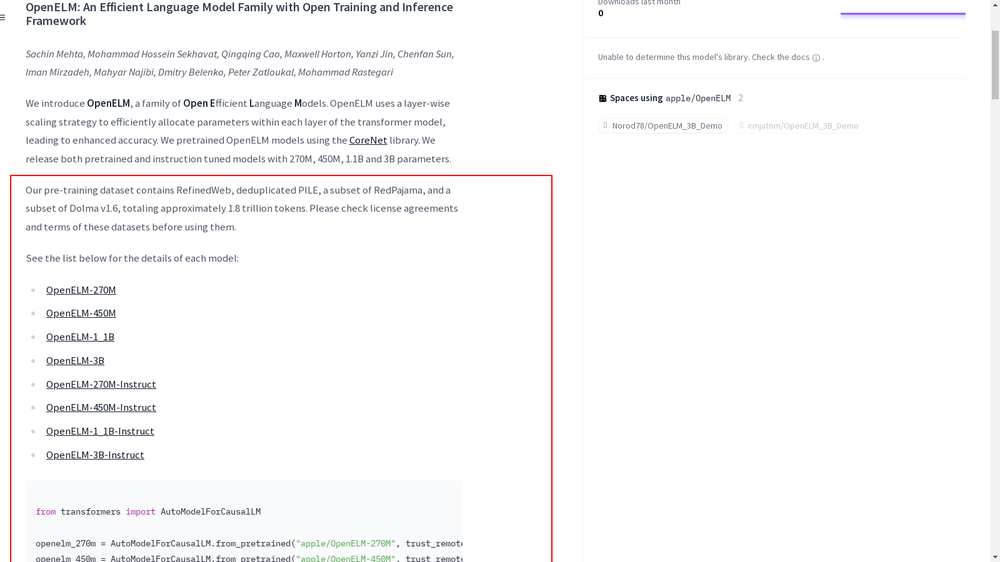

In [15]:
ground_truth_xpath = "/html/body/div[1]/main/div[2]/section[1]/div[3]/div[3]"
ground_truth_element = driver.find_element(By.XPATH, ground_truth_xpath)
display_bounding_box(ground_truth_element, driver)

In [11]:
get_full_xpath(driver, openelm_section)

'/html/body[1]/div[1]/main[1]/div[2]/section[1]/div[3]/div[1]/div[1]/div[1]/div[1]/div[1]/nav[1]/ul[1]/li[1]/a[1]'

In [24]:
driver.get("https://huggingface.co/CohereForAI/c4ai-command-r-plus")

In [27]:
objective = "Type 'What is love?' in the chat box"
expanded_instructions = get_instructions(driver, objective)[0]

In [33]:
expanded_instructions

"Select the input element with placeholder 'Your sentence here...' under the 'Inference API' section, then type 'What is love?'."

In [ ]:
expanded_instructions = "Select the input element with placeholder 'Your sentence here...' under the 'Inference API' section, then type 'What is love?' and press 'Enter'"

In [34]:
html = driver.page_source
expanded_instructions = "Select the input element with placeholder 'Your sentence here...' under the 'Inference API' section, then type 'What is love?' and press 'Enter'"

action = action_engine.get_action(expanded_instructions, html)

/home/daniel/miniconda3/envs/lavague/lib/python3.10/site-packages/tree_sitter/__init__.py:36: FutureWarning: Language(path, name) is deprecated. Use Language(ptr, name) instead.
  warn("{} is deprecated. Use {} instead.".format(old, new), FutureWarning)
